<img src = "imagefifa.png"/>

# COLLEGE OF ENGINEERING AND TECHNOLOGY, BHUBANESWAR

## DEPARTMENT OF COMPUTER SCIENCE AND APPLICATION (MCA)

## MACHINE LEARNING PROJECT ON FIFA 22 ANALYSIS

### Submitted by:
#### Suraj Kumar Roy
#### Regd. No.: 2005106029
#### MCA 1ST Year (2nd Semester)
#### 2020-2022

In [1]:
#Lets start by importing libraries

# Data Analysis
import numpy as np
import pandas as pd 

# Data visualisations
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objs as go
import plotly.express as px
%matplotlib inline

In [2]:
import warnings
warnings.simplefilter (action = 'ignore', category = Warning)

In [3]:
#Reading the dataset

data = pd.read_csv('data.csv')
print(data.shape)

(18207, 89)


In [4]:
data.head(10)

,Unnamed: 0,ID,Name,Age,Photo,Nationality,Flag,Overall,Potential,Club,...,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Release Clause
0,0,158023,L. Messi,31,https://cdn.sofifa.org/players/4/19/158023.png,Argentina,https://cdn.sofifa.org/flags/52.png,94,94,FC Barcelona,...,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0,€226.5M
1,1,20801,Cristiano Ronaldo,33,https://cdn.sofifa.org/players/4/19/20801.png,Portugal,https://cdn.sofifa.org/flags/38.png,94,94,Juventus,...,95.0,28.0,31.0,23.0,7.0,11.0,15.0,14.0,11.0,€127.1M
2,2,190871,Neymar Jr,26,https://cdn.sofifa.org/players/4/19/190871.png,Brazil,https://cdn.sofifa.org/flags/54.png,92,93,Paris Saint-Germain,...,94.0,27.0,24.0,33.0,9.0,9.0,15.0,15.0,11.0,€228.1M
3,3,193080,De Gea,27,https://cdn.sofifa.org/players/4/19/193080.png,Spain,https://cdn.sofifa.org/flags/45.png,91,93,Manchester United,...,68.0,15.0,21.0,13.0,90.0,85.0,87.0,88.0,94.0,€138.6M
4,4,192985,K. De Bruyne,27,https://cdn.sofifa.org/players/4/19/192985.png,Belgium,https://cdn.sofifa.org/flags/7.png,91,92,Manchester City,...,88.0,68.0,58.0,51.0,15.0,13.0,5.0,10.0,13.0,€196.4M
5,5,183277,E. Hazard,27,https://cdn.sofifa.org/players/4/19/183277.png,Belgium,https://cdn.sofifa.org/flags/7.png,91,91,Chelsea,...,91.0,34.0,27.0,22.0,11.0,12.0,6.0,8.0,8.0,€172.1M
6,6,177003,L. Modrić,32,https://cdn.sofifa.org/players/4/19/177003.png,Croatia,https://cdn.sofifa.org/flags/10.png,91,91,Real Madrid,...,84.0,60.0,76.0,73.0,13.0,9.0,7.0,14.0,9.0,€137.4M
7,7,176580,L. Suárez,31,https://cdn.sofifa.org/players/4/19/176580.png,Uruguay,https://cdn.sofifa.org/flags/60.png,91,91,FC Barcelona,...,85.0,62.0,45.0,38.0,27.0,25.0,31.0,33.0,37.0,€164M
8,8,155862,Sergio Ramos,32,https://cdn.sofifa.org/players/4/19/155862.png,Spain,https://cdn.sofifa.org/flags/45.png,91,91,Real Madrid,...,82.0,87.0,92.0,91.0,11.0,8.0,9.0,7.0,11.0,€104.6M
9,9,200389,J. Oblak,25,https://cdn.sofifa.org/players/4/19/200389.png,Slovenia,https://cdn.sofifa.org/flags/44.png,90,93,Atlético Madrid,...,70.0,27.0,12.0,18.0,86.0,92.0,78.0,88.0,89.0,€144.5M


In [5]:
#Describing the data

data.describe()

,Unnamed: 0,ID,Age,Overall,Potential,Special,International Reputation,Weak Foot,Skill Moves,Jersey Number,...,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes
count,18207.000000,18207.000000,18207.000000,18207.000000,18207.000000,18207.000000,18159.000000,18159.000000,18159.000000,18147.000000,...,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000
mean,9103.000000,214298.338606,25.122206,66.238699,71.307299,1597.809908,1.113222,2.947299,2.361308,19.546096,...,48.548598,58.648274,47.281623,47.697836,45.661435,16.616223,16.391596,16.232061,16.388898,16.710887
std,5256.052511,29965.244204,4.669943,6.908930,6.136496,272.586016,0.394031,0.660456,0.756164,15.947765,...,15.704053,11.436133,19.904397,21.664004,21.289135,17.695349,16.906900,16.502864,17.034669,17.955119
min,0.000000,16.000000,16.000000,46.000000,48.000000,731.000000,1.000000,1.000000,1.000000,1.000000,...,5.000000,3.000000,3.000000,2.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,4551.500000,200315.500000,21.000000,62.000000,67.000000,1457.000000,1.000000,3.000000,2.000000,8.000000,...,39.000000,51.000000,30.000000,27.000000,24.000000,8.000000,8.000000,8.000000,8.000000,8.000000
50%,9103.000000,221759.000000,25.000000,66.000000,71.000000,1635.000000,1.000000,3.000000,2.000000,17.000000,...,49.000000,60.000000,53.000000,55.000000,52.000000,11.000000,11.000000,11.000000,11.000000,11.000000
75%,13654.500000,236529.500000,28.000000,71.000000,75.000000,1787.000000,1.000000,3.000000,3.000000,26.000000,...,60.000000,67.000000,64.000000,66.000000,64.000000,14.000000,14.000000,14.000000,14.000000,14.000000
max,18206.000000,246620.000000,45.000000,94.000000,95.000000,2346.000000,5.000000,5.000000,5.000000,99.000000,...,92.000000,96.000000,94.000000,93.000000,91.000000,90.000000,92.000000,91.000000,90.000000,94.000000


In [6]:
#Analysing the Club, Let's analyse my favourite club "Real Madrid"

def club(x):
    return data[data['Club'] == x][['Name','Jersey Number','Position','Overall','Nationality','Age','Wage',
                                    'Value','Contract Valid Until']]

club('Real Madrid')

,Name,Jersey Number,Position,Overall,Nationality,Age,Wage,Value,Contract Valid Until
6,L. Modrić,10.0,RCM,91,Croatia,32,€420K,€67M,2020
8,Sergio Ramos,15.0,RCB,91,Spain,32,€380K,€51M,2020
11,T. Kroos,8.0,LCM,90,Germany,28,€355K,€76.5M,2022
19,T. Courtois,1.0,GK,89,Belgium,26,€240K,€53.5M,2024
27,Casemiro,14.0,CDM,88,Brazil,26,€285K,€59.5M,2021
30,Isco,22.0,LW,88,Spain,26,€315K,€73.5M,2022
35,Marcelo,12.0,LB,88,Brazil,30,€285K,€43M,2022
36,G. Bale,11.0,ST,88,Wales,28,€355K,€60M,2022
46,K. Navas,1.0,GK,87,Costa Rica,31,€195K,€30.5M,2020
62,R. Varane,4.0,RCB,86,France,25,€210K,€50M,2022


In [7]:
x = club('Real Madrid')
x.shape

(33, 9)

In [8]:
# Filling the missing value for the continuous variables for proper data visualization

data['ShortPassing'].fillna(data['ShortPassing'].mean(), inplace = True)
data['Volleys'].fillna(data['Volleys'].mean(), inplace = True)
data['Dribbling'].fillna(data['Dribbling'].mean(), inplace = True)
data['Curve'].fillna(data['Curve'].mean(), inplace = True)
data['FKAccuracy'].fillna(data['FKAccuracy'], inplace = True)
data['LongPassing'].fillna(data['LongPassing'].mean(), inplace = True)
data['BallControl'].fillna(data['BallControl'].mean(), inplace = True)
data['HeadingAccuracy'].fillna(data['HeadingAccuracy'].mean(), inplace = True)
data['Finishing'].fillna(data['Finishing'].mean(), inplace = True)
data['Crossing'].fillna(data['Crossing'].mean(), inplace = True)
data['Weight'].fillna('200lbs', inplace = True)
data['Contract Valid Until'].fillna(2019, inplace = True)
data['Height'].fillna("5'11", inplace = True)
data['Loaned From'].fillna('None', inplace = True)
data['Joined'].fillna('Jul 1, 2018', inplace = True)
data['Jersey Number'].fillna(8, inplace = True)
data['Body Type'].fillna('Normal', inplace = True)
data['Position'].fillna('ST', inplace = True)
data['Club'].fillna('No Club', inplace = True)
data['Work Rate'].fillna('Medium/ Medium', inplace = True)
data['Skill Moves'].fillna(data['Skill Moves'].median(), inplace = True)
data['Weak Foot'].fillna(3, inplace = True)
data['Preferred Foot'].fillna('Right', inplace = True)
data['International Reputation'].fillna(1, inplace = True)
data['Wage'].fillna('€200K', inplace = True)
data.fillna(0, inplace = True)

In [9]:
def defending(data):
    return int(round((data[['Marking', 'StandingTackle', 
                               'SlidingTackle']].mean()).mean()))

def general(data):
    return int(round((data[['HeadingAccuracy', 'Dribbling', 'Curve', 
                               'BallControl']].mean()).mean()))

def mental(data):
    return int(round((data[['Aggression', 'Interceptions', 'Positioning', 
                               'Vision','Composure']].mean()).mean()))

def passing(data):
    return int(round((data[['Crossing', 'ShortPassing', 
                               'LongPassing']].mean()).mean()))

def mobility(data):
    return int(round((data[['Acceleration', 'SprintSpeed', 
                               'Agility','Reactions']].mean()).mean()))
def power(data):
    return int(round((data[['Balance', 'Jumping', 'Stamina', 
                               'Strength']].mean()).mean()))

def rating(data):
    return int(round((data[['Potential', 'Overall']].mean()).mean()))

def shooting(data):
    return int(round((data[['Finishing', 'Volleys', 'FKAccuracy', 
                               'ShotPower','LongShots', 'Penalties']].mean()).mean()))

In [10]:
#Renaming the columns

data.rename(columns={'Club Logo':'Club_Logo'}, inplace=True)
data['Defending'] = data.apply(defending, axis = 1)
data['General'] = data.apply(general, axis = 1)
data['Mental'] = data.apply(mental, axis = 1)
data['Passing'] = data.apply(passing, axis = 1)
data['Mobility'] = data.apply(mobility, axis = 1)
data['Power'] = data.apply(power, axis = 1)
data['Rating'] = data.apply(rating, axis = 1)
data['Shooting'] = data.apply(shooting, axis = 1)

In [11]:
players = data[['Name','Nationality', 'Club', 'Age', 'Rating', 'General', 
                'Passing', 'Power', 'Shooting', 'Defending']]

players.head(11)

,Name,Nationality,Club,Age,Rating,General,Passing,Power,Shooting,Defending
0,L. Messi,Argentina,FC Barcelona,31,94,89,87,74,88,29
1,Cristiano Ronaldo,Portugal,Juventus,33,94,88,81,83,88,27
2,Neymar Jr,Brazil,Paris Saint-Germain,26,92,85,80,69,84,28
3,De Gea,Spain,Manchester United,27,92,26,39,54,21,16
4,K. De Bruyne,Belgium,Manchester City,27,92,79,92,76,85,59
5,E. Hazard,Belgium,Chelsea,27,91,83,84,75,82,28
6,L. Modrić,Croatia,Real Madrid,32,91,81,89,77,78,70
7,L. Suárez,Uruguay,FC Barcelona,31,91,85,74,81,87,48
8,Sergio Ramos,Spain,Real Madrid,32,91,78,74,82,68,90
9,J. Oblak,Slovenia,Atlético Madrid,25,92,14,23,61,14,19


In [12]:
#Eliminating certain columns from analysis

data.drop(['ID', 'Photo', 'Flag', 'Real Face', 'Jersey Number', 
           'Loaned From'], axis = 1, inplace = True)

### Data Visualisation

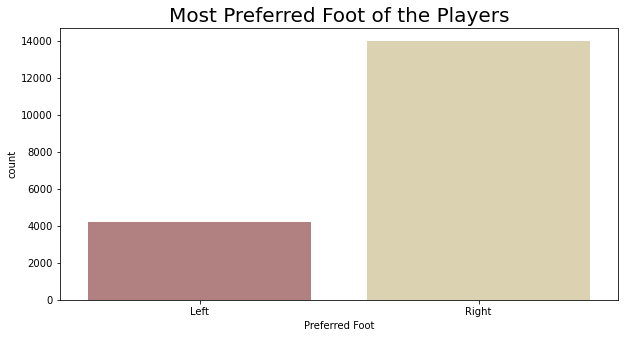

In [13]:
#Comparison of preferred foot over the different players

plt.rcParams['figure.figsize'] = (10, 5)
sns.countplot(data['Preferred Foot'], palette = 'pink')
plt.title('Most Preferred Foot of the Players', fontsize = 20)
plt.show()

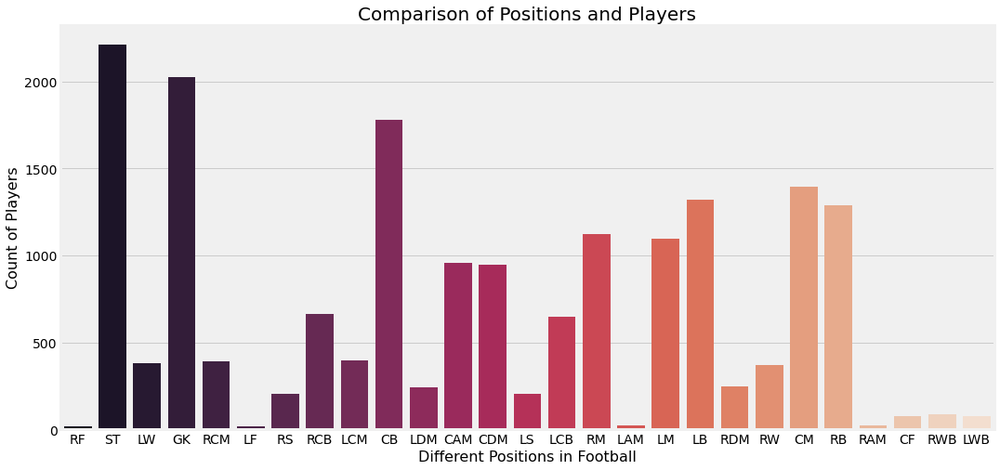

In [14]:
#Different positions acquired by the players 

plt.figure(figsize = (18, 8))
plt.style.use('fivethirtyeight')
ax = sns.countplot('Position', data = data, palette = 'rocket')
ax.set_xlabel(xlabel = 'Different Positions in Football', fontsize = 16)
ax.set_ylabel(ylabel = 'Count of Players', fontsize = 16)
ax.set_title(label = 'Comparison of Positions and Players', fontsize = 20)
plt.show()

In [15]:
#Defining a function for cleaning the Weight data

def extract_value_from(value):
  out = value.replace('lbs', '')
  return float(out)

# applying the function to weight column
#data['value'] = data['value'].apply(lambda x: extract_value_from(x))
data['Weight'] = data['Weight'].apply(lambda x : extract_value_from(x))

data['Weight'].head()

0    159.0
1    183.0
2    150.0
3    168.0
4    154.0
Name: Weight, dtype: float64

In [16]:
#Defining a function for cleaning the wage column

def extract_value_from(Value):
    out = Value.replace('€', '')
    if 'M' in out:
        out = float(out.replace('M', ''))*1000000
    elif 'K' in Value:
        out = float(out.replace('K', ''))*1000
    return float(out)

In [17]:
#Applying the function to the wage column

data['Value'] = data['Value'].apply(lambda x: extract_value_from(x))
data['Wage'] = data['Wage'].apply(lambda x: extract_value_from(x))
data['Wage'].head()

0    565000.0
1    405000.0
2    290000.0
3    260000.0
4    355000.0
Name: Wage, dtype: float64

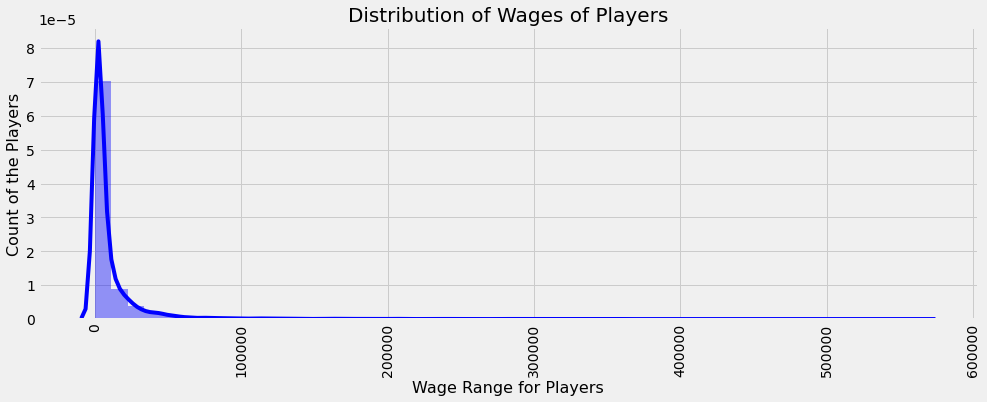

In [18]:
#Comparing the players’ Wages

import warnings
warnings.filterwarnings('ignore')
plt.rcParams['figure.figsize'] = (15, 5)
sns.distplot(data['Wage'], color = 'blue')
plt.xlabel('Wage Range for Players', fontsize = 16)
plt.ylabel('Count of the Players', fontsize = 16)
plt.title('Distribution of Wages of Players', fontsize = 20)
plt.xticks(rotation = 90)
plt.show()

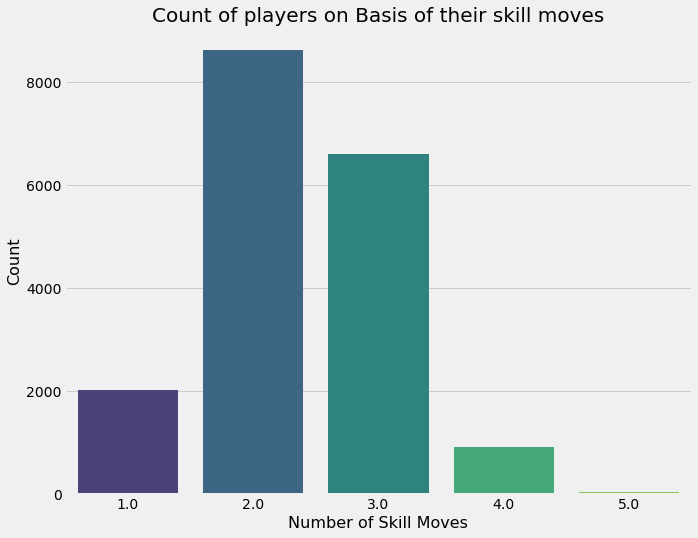

In [19]:
#Skill Moves of Players

plt.figure(figsize = (10, 8))
ax = sns.countplot(x = 'Skill Moves', data = data, palette = 'viridis')
ax.set_title(label = 'Count of players on Basis of their skill moves', fontsize = 20)
ax.set_xlabel(xlabel = 'Number of Skill Moves', fontsize = 16)
ax.set_ylabel(ylabel = 'Count', fontsize = 16)
plt.show()

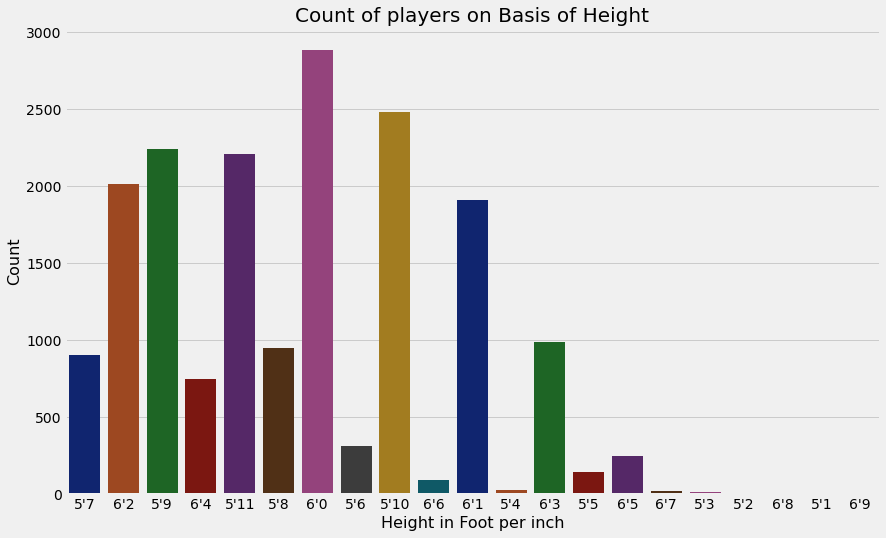

In [20]:
#Height of Players

plt.figure(figsize = (13, 8))
ax = sns.countplot(x = 'Height', data = data, palette = 'dark')
ax.set_title(label = 'Count of players on Basis of Height', fontsize = 20)
ax.set_xlabel(xlabel = 'Height in Foot per inch', fontsize = 16)
ax.set_ylabel(ylabel = 'Count', fontsize = 16)
plt.show()

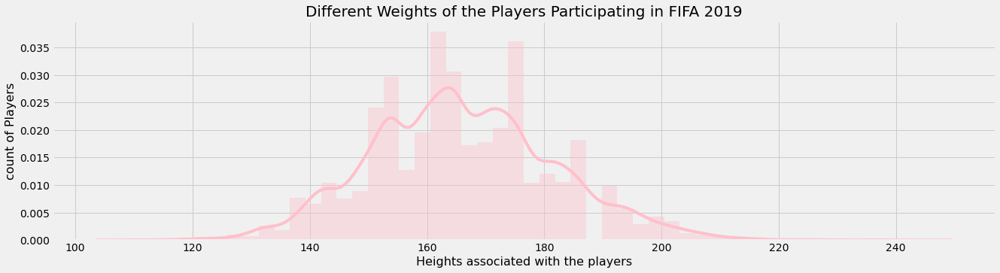

In [21]:
#Weight of Players

plt.figure(figsize = (20, 5))
sns.distplot(data['Weight'], color = 'pink')
plt.title('Different Weights of the Players Participating in FIFA 2019', fontsize = 20)
plt.xlabel('Heights associated with the players', fontsize = 16)
plt.ylabel('count of Players', fontsize = 16)
plt.show()

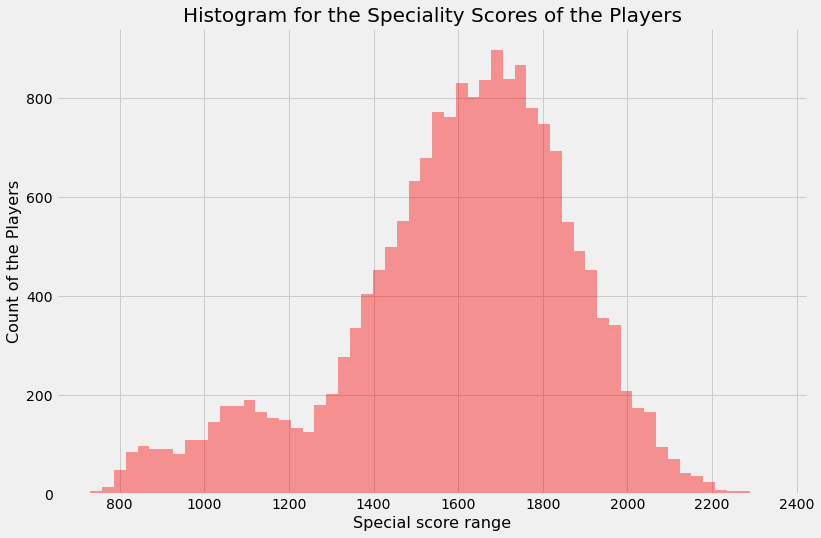

In [22]:
# Speciality Score of the players 

x = data.Special
plt.figure(figsize = (12, 8))
plt.style.use('tableau-colorblind10')
ax = sns.distplot(x, bins = 58, kde = False, color = 'r')
ax.set_xlabel(xlabel = 'Special score range', fontsize = 16)
ax.set_ylabel(ylabel = 'Count of the Players',fontsize = 16)
ax.set_title(label = 'Histogram for the Speciality Scores of the Players', fontsize = 20)
plt.show()

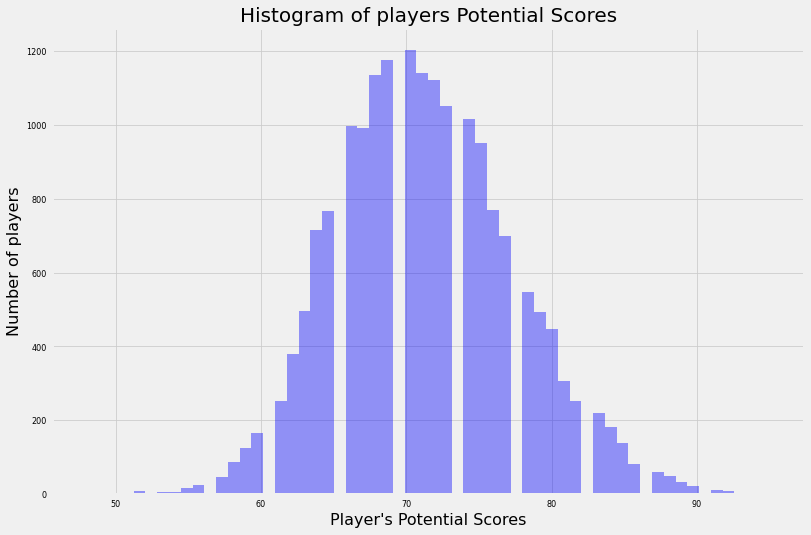

In [23]:
# Potential scores of the players

x = data.Potential
plt.figure(figsize=(12,8))
plt.style.use('seaborn-paper')

ax = sns.distplot(x, bins = 58, kde = False, color = 'b')
ax.set_xlabel(xlabel = "Player\'s Potential Scores", fontsize = 16)
ax.set_ylabel(ylabel = 'Number of players', fontsize = 16)
ax.set_title(label = 'Histogram of players Potential Scores', fontsize = 20)
plt.show()

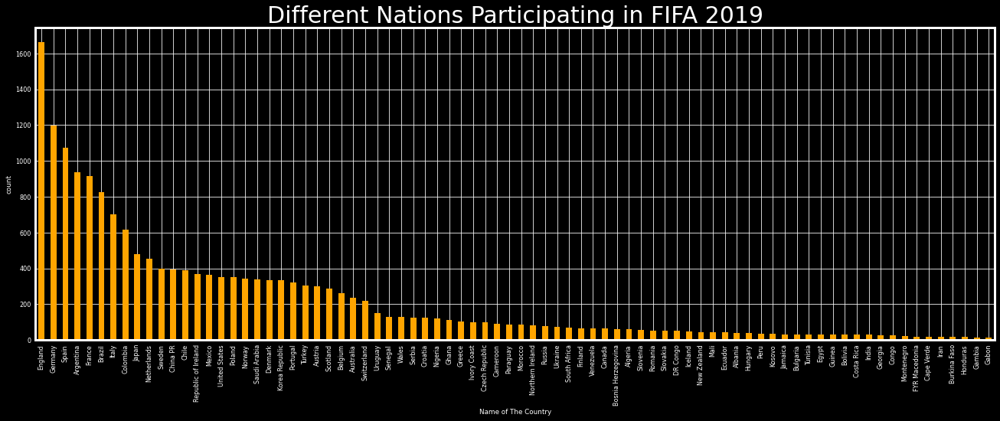

In [24]:
# Nations

plt.style.use('dark_background')
data['Nationality'].value_counts().head(80).plot.bar(color = 'orange', figsize = (20, 7))
plt.title('Different Nations Participating in FIFA 2019', fontsize = 30, fontweight = 20)
plt.xlabel('Name of The Country')
plt.ylabel('count')
ax.set(facecolor = "wheat")
plt.show()

In [25]:
# Countries with Most Players

data['Nationality'].value_counts().head(10)

England        1662
Germany        1198
Spain          1072
Argentina       937
France          914
Brazil          827
Italy           702
Colombia        618
Japan           478
Netherlands     453
Name: Nationality, dtype: int64

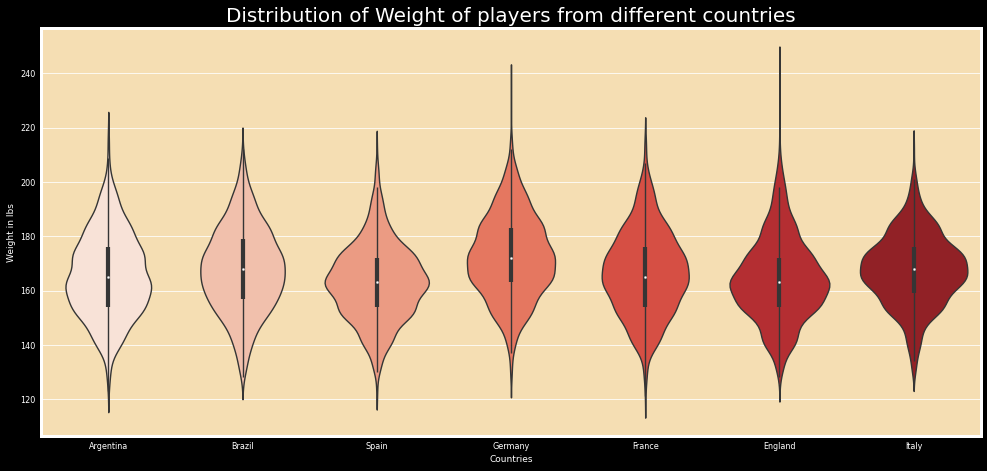

In [26]:
# Every Nations’ Player and their Weights

some_countries = ('England', 'Germany', 'Spain', 'Argentina', 'France', 'Brazil', 'Italy', 'Columbia')
data_countries = data.loc[data['Nationality'].isin(some_countries) & data['Weight']]

plt.rcParams['figure.figsize'] = (15, 7)
ax = sns.violinplot(x = data_countries['Nationality'], y = data_countries['Weight'], palette = 'Reds')
ax.set_xlabel(xlabel = 'Countries', fontsize = 9)
ax.set_ylabel(ylabel = 'Weight in lbs', fontsize = 9)
ax.set_title(label = 'Distribution of Weight of players from different countries', fontsize = 20)
ax.set(facecolor = "wheat")
plt.show()

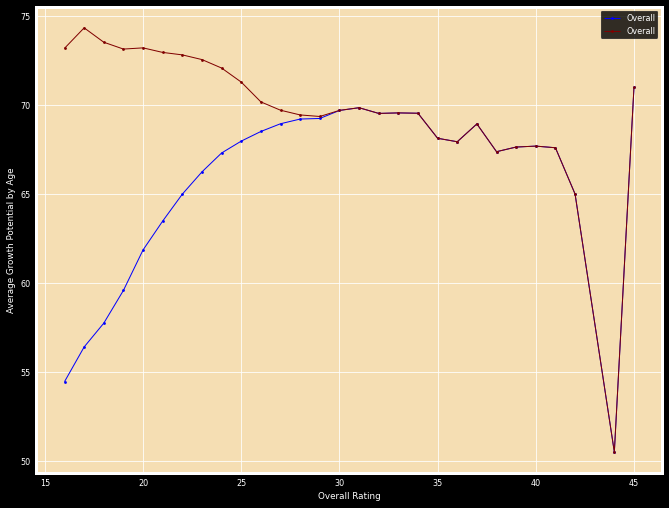

In [27]:
#Distribution of Age by Potential and Overall Rating

overall = pd.DataFrame(data.groupby(["Age"])['Overall'].mean())
potential = pd.DataFrame(data.groupby(["Age"])['Potential'].mean())

merged = pd.merge(overall, potential, on='Age', how='inner')
merged['Age']= merged.index

fig, ax = plt.subplots(figsize=(10,8))

merged.reset_index(drop = True, inplace = True)

plt.plot('Age', 'Overall', data = merged, marker = '.', color = 'blue', lw = 1, label = 'Overall')
plt.plot('Age', 'Potential', data = merged, marker = '.', color = 'maroon', lw = 1, label = 'Overall')
plt.xlabel('Overall Rating')
plt.ylabel('Average Growth Potential by Age')
ax.set(facecolor = "wheat")
plt.legend();

In [28]:
# Finding the the popular clubs around the globe

data['Club'].value_counts().head(10)

No Club                    241
FC Barcelona                33
Burnley                     33
AS Monaco                   33
Everton                     33
TSG 1899 Hoffenheim         33
Wolverhampton Wanderers     33
Eintracht Frankfurt         33
Southampton                 33
Valencia CF                 33
Name: Club, dtype: int64

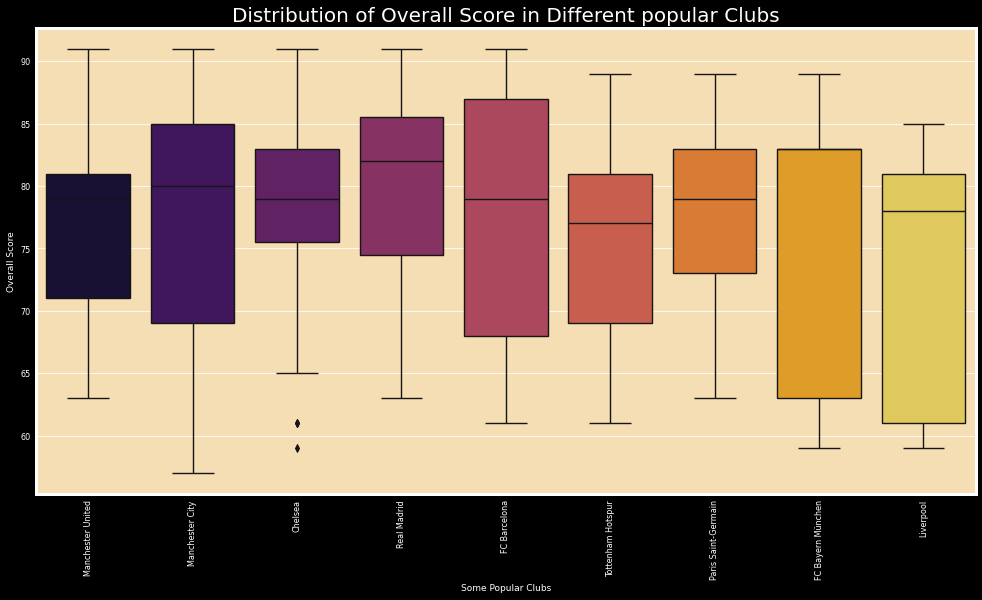

In [29]:
some_clubs = ('Manchester City', 'FC Bayern München', 'Chelsea', 'Liverpool', 
              'Manchester United', 'Manchestar City',
             'Tottenham Hotspur', 'FC Barcelona', 'Paris Saint-Germain', 
              'Chelsea', 'Real Madrid')

data_clubs = data.loc[data['Club'].isin(some_clubs) & data['Overall']]

plt.rcParams['figure.figsize'] = (15, 8)
ax = sns.boxplot(x = data_clubs['Club'], y = data_clubs['Overall'], palette = 'inferno')
ax.set_xlabel(xlabel = 'Some Popular Clubs', fontsize = 9)
ax.set_ylabel(ylabel = 'Overall Score', fontsize = 9)
ax.set_title(label = 'Distribution of Overall Score in Different popular Clubs', fontsize = 20)
plt.xticks(rotation = 90)
ax.set(facecolor = "wheat")
plt.show()

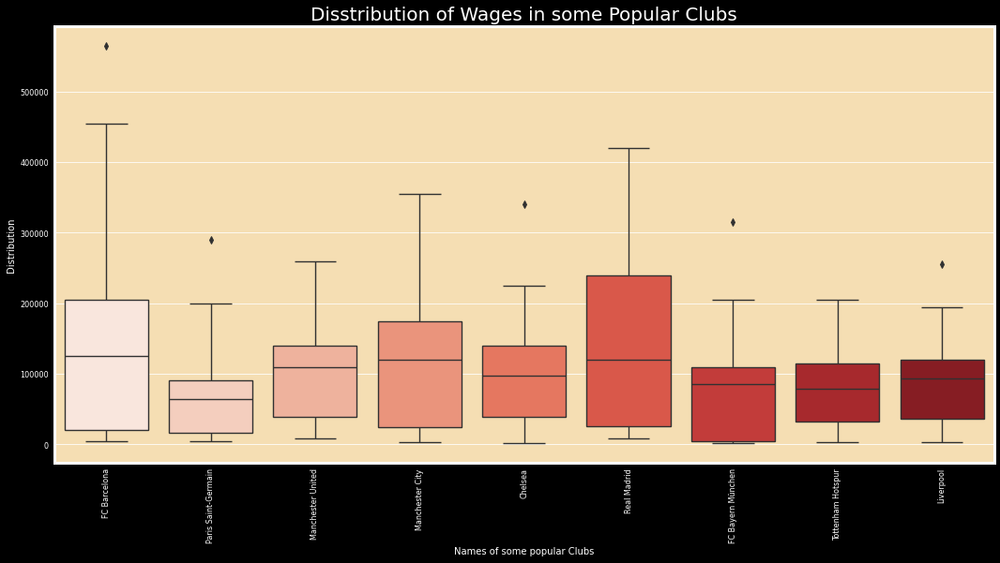

In [30]:
#Distribution of Wages in some Popular clubs

some_clubs = ('Manchester City', 'FC Bayern München', 'Chelsea', 'Liverpool', 
              'Manchester United', 'Manchestar City',
             'Tottenham Hotspur', 'FC Barcelona', 'Paris Saint-Germain', 
              'Chelsea', 'Real Madrid')

data_club = data.loc[data['Club'].isin(some_clubs) & data['Wage']]

plt.rcParams['figure.figsize'] = (16, 8)
ax = sns.boxplot(x = 'Club', y = 'Wage', data = data_club, palette = 'Reds')
ax.set_xlabel(xlabel = 'Names of some popular Clubs', fontsize = 10)
ax.set_ylabel(ylabel = 'Distribution', fontsize = 10)
ax.set_title(label = 'Disstribution of Wages in some Popular Clubs', fontsize = 20)
plt.xticks(rotation = 90)
ax.set(facecolor = "wheat")
plt.show()

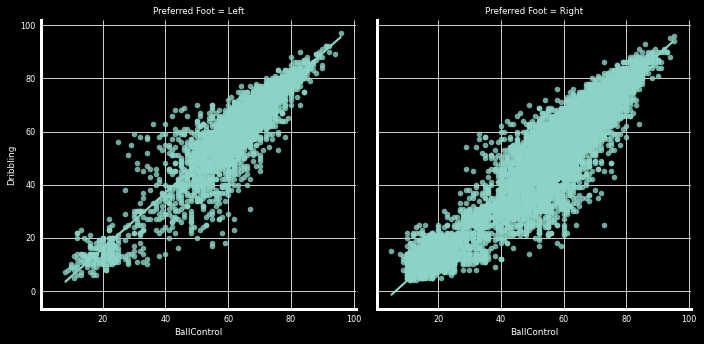

In [31]:
#Comparing the performance of left-footed and right-footed footballers

# ballcontrol vs dribbing

sns.lmplot(x = 'BallControl', y = 'Dribbling', data = data, col = 'Preferred Foot')
ax.set(facecolor = "Wheat")
plt.show()

### Predicting the best XI

In [32]:
#Top 20 teams with highest player average value

club = data.groupby('Club')['Value'].mean().reset_index().sort_values('Value', 
                                                    ascending = True).tail(10)
fig = px.bar(club, x = 'Value', y = 'Club', orientation = 'h')
fig.show()

In [33]:
#Top 20 teams with highest player average Overall Rating

club = data.groupby('Club')['Overall'].mean().reset_index().sort_values('Overall', 
                                                    ascending = True).tail(10)
fig = px.bar(club, x = 'Overall', y = 'Club', orientation = 'h')
fig.show()

In [34]:
#Top Skills of every Playing Positions

player_features = ["Crossing", "Finishing", "HeadingAccuracy", "ShortPassing",
                    "Volleys", "Dribbling", "Curve", "FKAccuracy", "LongPassing", "BallControl", "Acceleration", "SprintSpeed", "Agility", "Reactions", 
                    "Balance", "ShotPower", "Jumping", "Stamina", "Strength", 
                    "LongShots", "Aggression", "Interceptions", "Positioning", 
                    "Vision", "Penalties", "Composure", "Marking", 
                    "StandingTackle", "SlidingTackle", "GKDiving", "GKHandling",
                    "GKKicking", "GKPositioning", "GKReflexes"]
df_position = pd.DataFrame()
for position_name, features in data.groupby(data['Position'])[player_features].mean().iterrows():
    top_features = dict(features.nlargest(5))
    df_position[position_name] = tuple(top_features)
df_position.head()

,CAM,CB,CDM,CF,CM,GK,LAM,LB,LCB,LCM,...,RB,RCB,RCM,RDM,RF,RM,RS,RW,RWB,ST
0,Balance,Strength,Stamina,Agility,Balance,GKReflexes,Agility,SprintSpeed,Strength,Stamina,...,SprintSpeed,Strength,Stamina,Stamina,Agility,Acceleration,SprintSpeed,Acceleration,SprintSpeed,SprintSpeed
1,Agility,Jumping,Aggression,Balance,ShortPassing,GKDiving,Balance,Acceleration,Jumping,ShortPassing,...,Stamina,Jumping,ShortPassing,ShortPassing,Acceleration,SprintSpeed,Strength,SprintSpeed,Acceleration,Strength
2,Acceleration,StandingTackle,Strength,Acceleration,Agility,GKPositioning,SprintSpeed,Stamina,StandingTackle,Balance,...,Acceleration,Aggression,Agility,Aggression,Balance,Agility,Acceleration,Agility,Stamina,Acceleration
3,SprintSpeed,Aggression,ShortPassing,SprintSpeed,Stamina,GKHandling,Acceleration,Balance,Aggression,Agility,...,Balance,StandingTackle,Balance,Strength,BallControl,Balance,Agility,Balance,Agility,Jumping
4,BallControl,HeadingAccuracy,Jumping,Dribbling,Acceleration,GKKicking,Dribbling,Agility,HeadingAccuracy,BallControl,...,Jumping,HeadingAccuracy,BallControl,Jumping,SprintSpeed,Dribbling,ShotPower,Dribbling,Balance,Finishing


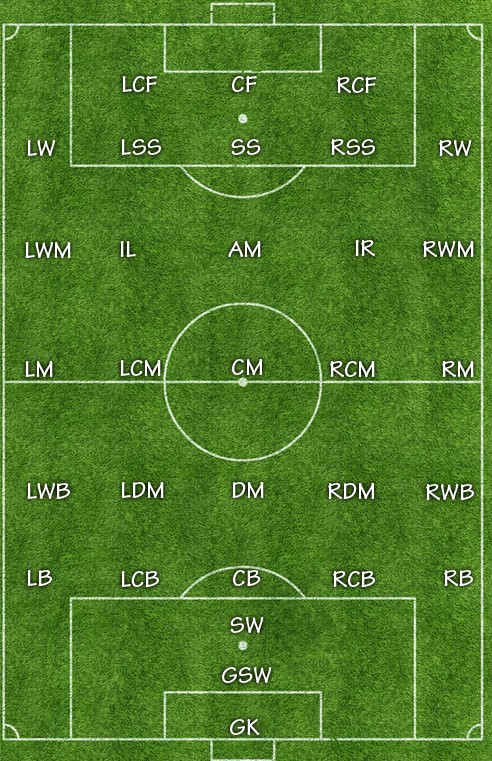

### Dream Team

In [35]:
position = []
player = []
club_l = []
for col in df_position.columns:
    tmp_df = pd.DataFrame()
    l = [df_position[col].values]
    l = l[0]
    l = list(l)
    l.append("Name")
    tmp_df = pd.DataFrame.copy(data[data["Position"] == col][l])
    tmp_df['mean'] = np.mean(tmp_df.iloc[: , :-1], axis = 1)
    name = tmp_df["Name"][tmp_df["mean"] == tmp_df["mean"].max()].values[0]
    club = data['Club'][data["Name"] == str(name)].values[0]
    position.append(col)
    player.append(name)
    club_l.append(club)
    
gk = ["GK"]
forward = ["LS", "ST", "RS", "LF", "CF", "RF"]
midfielder = ["LW", "RW", "LAM", "CAM", "RAM", "LM", "LCM",
              "CM", "RCM", "RM", "LDM", "CDM", "RDM"]
defenders = ["LWB", "RWB", "LB", "LCB", "CB", "RCB", "RB"]

print ("Goalkeeper: ")
for p, n, c in zip(position, player, club_l):
    if p in gk:
        print("{} [Club : {}, Position: {}]".format(n, c, p))
print ("\nFORWARD: ")
for p, n, c in zip(position, player, club_l):
    if p in forward:
        print("{} [Club : {}, Position: {}]".format(n, c, p))
print ("\nMIDFIELDER: ")
for p, n, c in zip(position, player, club_l):
    if p in midfielder:
        print("{} [Club : {}, Position: {}]".format(n, c, p))
print ("\nDEFENDER: ")
for p, n, c in zip(position, player, club_l):
    if p in defenders:
        print("{} [Club : {}, Position: {}]".format(n, c, p))

Goalkeeper: 
De Gea [Club : Manchester United, Position: GK]

FORWARD: 
S. Giovinco [Club : Toronto FC, Position: CF]
E. Hazard [Club : Chelsea, Position: LF]
J. Martínez [Club : Atlanta United, Position: LS]
L. Messi [Club : FC Barcelona, Position: RF]
A. Saint-Maximin [Club : OGC Nice, Position: RS]
Cristiano Ronaldo [Club : Juventus, Position: ST]

MIDFIELDER: 
H. Nakagawa [Club : Kashiwa Reysol, Position: CAM]
Casemiro [Club : Real Madrid, Position: CDM]
N. Keïta [Club : Liverpool, Position: CM]
Paulo Daineiro [Club : Ceará Sporting Club, Position: LAM]
David Silva [Club : Manchester City, Position: LCM]
N. Kanté [Club : Chelsea, Position: LDM]
Douglas Costa [Club : Juventus, Position: LM]
Neymar Jr [Club : Paris Saint-Germain, Position: LW]
J. Cuadrado [Club : Juventus, Position: RAM]
L. Modrić [Club : Real Madrid, Position: RCM]
P. Pogba [Club : Manchester United, Position: RDM]
Gelson Martins [Club : Atlético Madrid, Position: RM]
R. Sterling [Club : Manchester City, Position: R

In [ ]:
plt.figure(1 , figsize = (15 , 7))           
create_football_formation(formation = [ 4 , 2 ] , 
                         label_4 = [LWB , LCB , RCB , RWB],
                         label_4W = [LW , LCM , CM , RW],
                         label_2 = [LF , RF],
                         )
plt.title('Best Fit for formation 4-4-2')
plt.show()

plt.figure(1 , figsize = (15 , 7))           
create_football_formation(formation = [ 4 , 2 ] , 
                         label_4 = [LB , CB , RCB , RB],
                         label_4W = [LAM , LDM , RDM , RAM],
                         label_2 = [LS , RS],
                         )
plt.title('OR\nBest Fit for formation 4-4-2')
plt.show()


plt.figure(1 , figsize = (15 , 7))           
create_football_formation(formation = [ 4 , 2 ] , 
                         label_4 = [LB , CB , RCB , RB],
                         label_4W = [LW , LDM , RDM , RW],
                         label_2 = [CF , ST],
                         )
plt.title('OR\nBest Fit for formation 4-4-2')
plt.show()


plt.figure(1 , figsize = (15 , 7))           
create_football_formation(formation = [ 4 , 2 ] , 
                         label_4 = [LB , CB , RCB , RB],
                         label_4W = [LW , LCM , RCM , RW],
                         label_2 = [CF , ST],
                         )
plt.title('OR\nBest Fit for formation 4-4-2')
plt.show()

plt.figure(1 , figsize = (15 , 7))           
create_football_formation(formation = [ 4 , 2 ] , 
                         label_4 = [LWB , LCB , RCB , RWB],
                         label_4W = [LW , LCM , CM , RW],
                         label_2 = [LF , RF],
                         )
plt.title('OR\nBest Fit for formation 4-4-2')
plt.show()


plt.figure(1 , figsize = (15 , 7))           
create_football_formation(formation = [ 4 , 2 , 3 , 1] , 
                         label_4 = [LWB , LCB , RCB , RWB],
                         label_2 = [LCM , RCM],
                         label_3 = [LF , CAM , RF],
                         label_1 = [ST])
plt.title('Best Fit for formation 4-2-3-1')
plt.show()

plt.figure(1 , figsize = (15 , 7))           
create_football_formation(formation = [ 4 , 2 , 3 , 1] , 
                         label_4 = [LWB , LB , RB , RWB],
                         label_2 = [LAM , RAM],
                         label_3 = [LW , CF , RW],
                         label_1 = [ST])
plt.title('OR\nBest Fit for formation 4-2-3-1')
plt.show()

plt.figure(1 , figsize = (15 , 7))
create_football_formation(formation = [ 4 , 2 , 3 , 1] , 
                         label_4 = [LWB , CB , RCB , RWB],
                         label_2 = [CM , CAM],
                         label_3 = [LF , CM , RF],
                         label_1 = [ST])
plt.title('OR\nBest Fit for formation 4-2-3-1')

plt.show()

plt.figure(1 , figsize = (15 , 7))           
create_football_formation(formation = [ 4 , 2 , 3 , 1] , 
                         label_4 = [LWB , LCB , RCB , RWB],
                         label_2 = [LCM , RCM],
                         label_3 = [LDM , CAM , RDM],
                         label_1 = [ST])
plt.title('OR\nBest Fit for formation 4-2-3-1')
plt.show()

plt.figure(1 , figsize = (15 , 7))           
create_football_formation(formation = [ 5, 4 , 1 ] , 
                         label_5 = [LWB , LCB , CB , RCB , RWB],
                         label_4 = [LW, LDM , RDM , RW],
                         label_1 = [ST])
plt.title('Best Fit for formation 5-4-1')
plt.show()

plt.figure(1 , figsize = (15 , 7))           
create_football_formation(formation = [ 4 , 3 ] , 
                         label_4 = [LWB , LCB , RCB , RWB],
                         label_3 = [LW, CAM , RW],
                         label_3W = [LF , ST , RF])
plt.title('Best Fit for formation 4-3-3')
plt.show()


plt.figure(1 , figsize = (15 , 7))           
create_football_formation(formation = [ 4 , 3 ] , 
                         label_4 = [LWB , CB , RB , RWB],
                         label_3 = [LAM, CM , RAM],
                         label_3W = [LS , CF , RS])
plt.title('OR\nBest Fit for formation 4-3-3')
plt.show()

plt.figure(1 , figsize = (15 , 7))           
create_football_formation(formation = [ 4 , 3 ] , 
                         label_4 = [LB , LCB , RCB , RB],
                         label_3 = [LDM, CDM , RDM],
                         label_3W = [LF , CF , RF])
plt.title('OR\nBest Fit for formation 4-3-3')
plt.show()

plt.figure(1 , figsize = (15 , 7))           
create_football_formation(formation = [ 4 , 3] , 
                         label_4 = [LWB , CB , RB , RWB],
                         label_3 = [LAM, CAM , RAM],
                         label_3W = [LS , ST , RS])
plt.title('OR\nBest Fit for formation 4-3-3')
plt.show()


plt.figure(1 , figsize = (15 , 7))           
create_football_formation(formation = [ 4 , 3] , 
                         label_4 = [LWB , CB , RB , RWB],
                         label_3 = [LCM, CAM , RCM],
                         label_3W = [LF , ST , RF])
plt.title('OR\nBest Fit for formation 4-3-3')
plt.show()

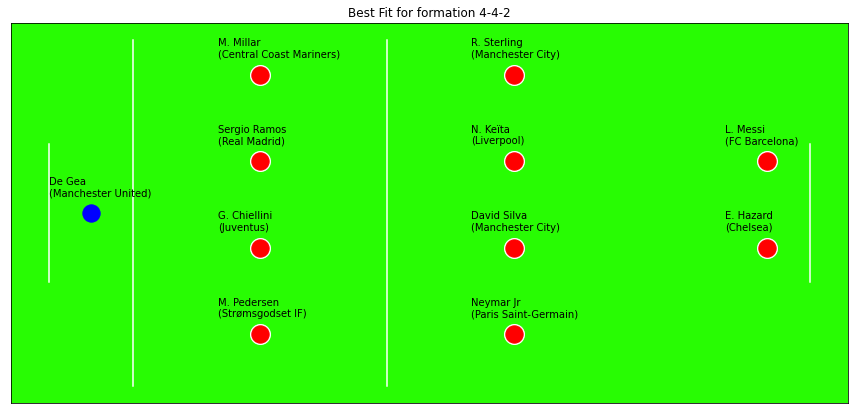

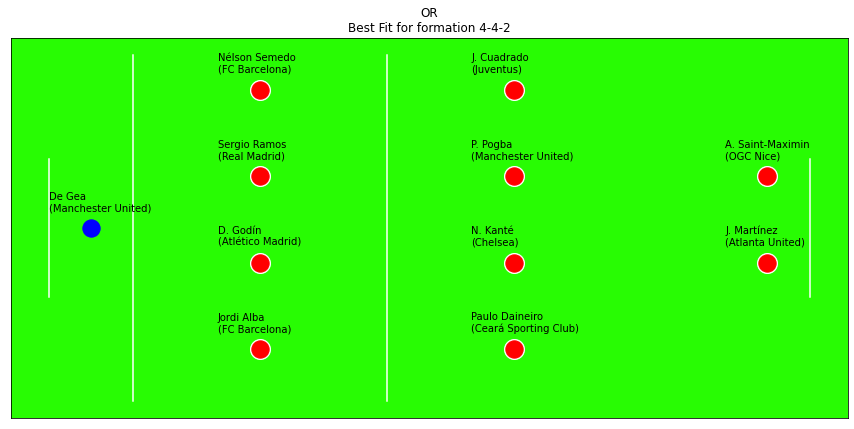

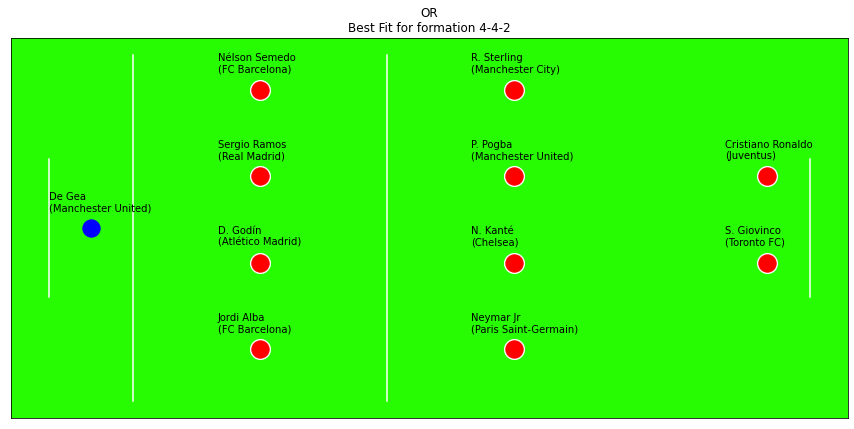

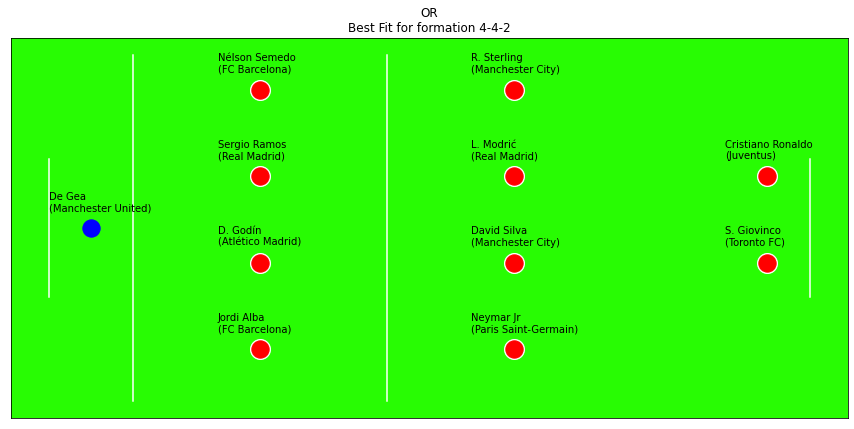

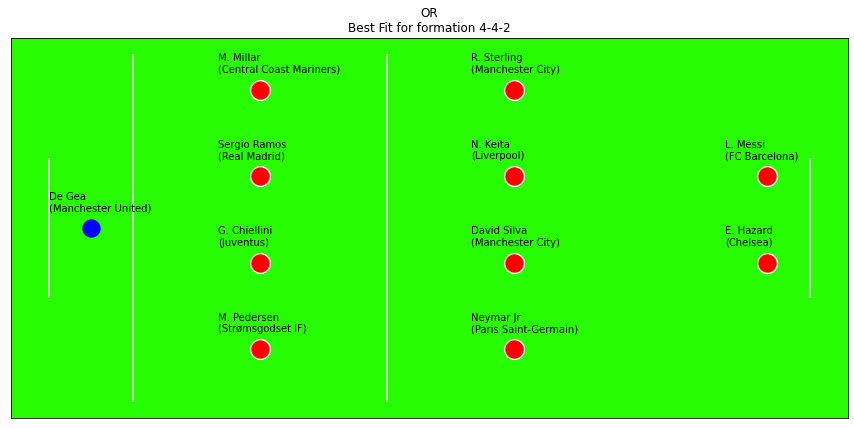

...

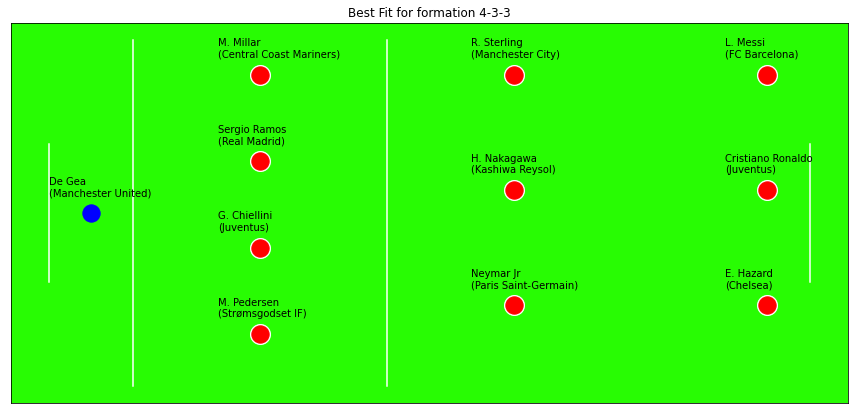

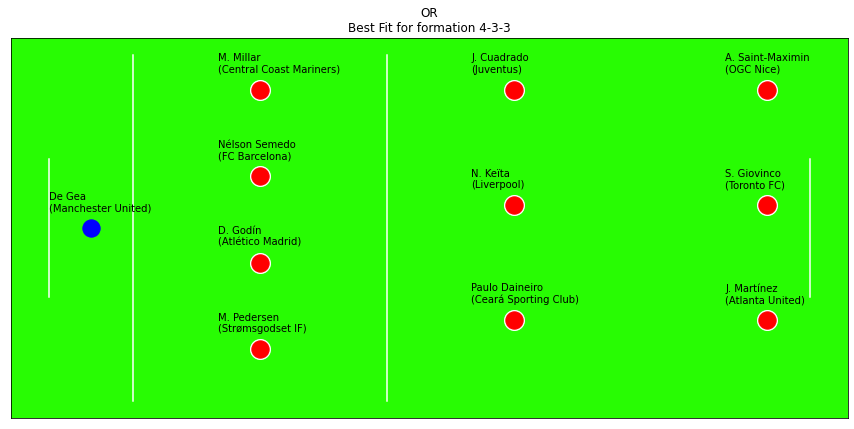

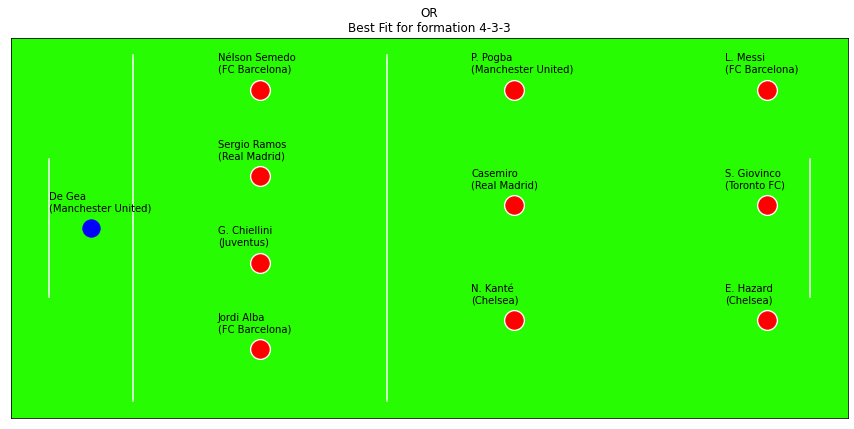

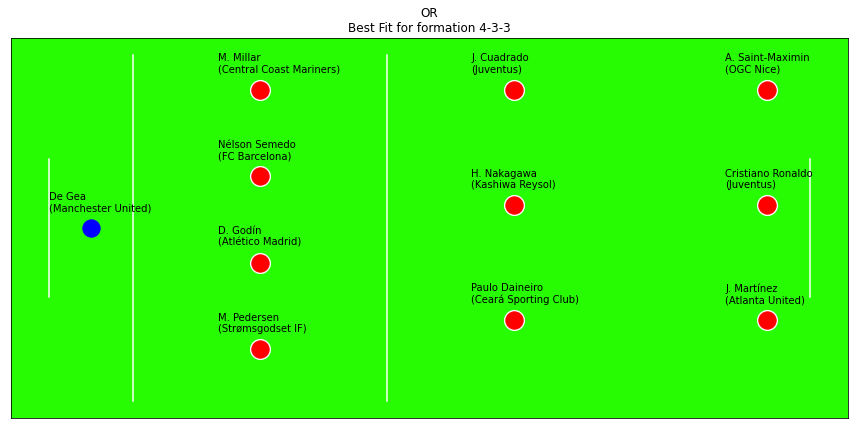

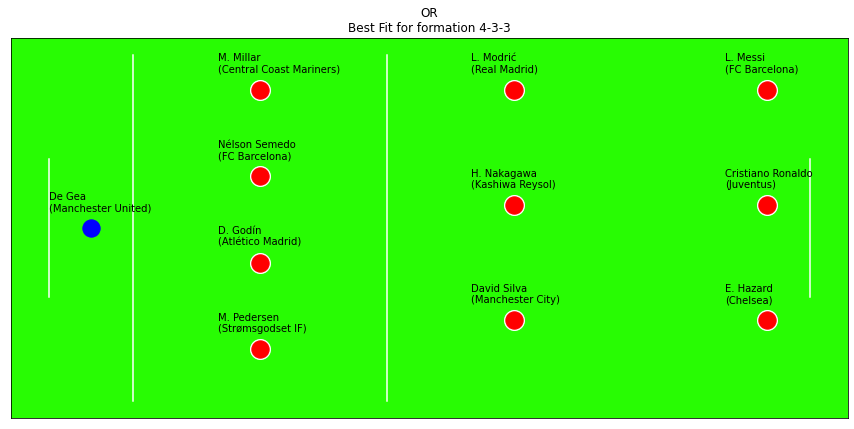

### Feature Engineering

In [68]:
#Get a count of Nationalities in the Dataset, make of list of those with over 250 Players (Major Playing Nations)
nat_counts = data["Nationality"].value_counts()
nat_list = nat_counts[nat_counts > 250].index.tolist()

#Replace Nationality with a binary indicator variable for 'Major Nation'
def major_nation(df):
    if (df["Nationality"] in nat_list):
        return 1
    else:
        return 0
    
data['Major_Nation'] = data.apply(major_nation,axis = 1)

In [69]:
#Turn Preferred Foot into a binary indicator variable
def right_footed(df):
    if (df['Preferred Foot'] == 'Right'):
        return 1
    else:
        return 0
data['Right_Foot'] = data.apply(right_footed, axis=1)

In [70]:
#Create a simplified position varaible to account for all player positions
def simple_position(df):
    if (df['Position'] == 'GK'):
        return 'GK'
    elif ((df['Position'] == 'RB') | (df['Position'] == 'LB') | (df['Position'] == 'CB') | (df['Position'] == 'LCB') | (df['Position'] == 'RCB') | (df['Position'] == 'RWB') | (df['Position'] == 'LWB') ):
        return 'DF'
    elif ((df['Position'] == 'LDM') | (df['Position'] == 'CDM') | (df['Position'] == 'RDM')):
        return 'DM'
    elif ((df['Position'] == 'LM') | (df['Position'] == 'LCM') | (df['Position'] == 'CM') | (df['Position'] == 'RCM') | (df['Position'] == 'RM')):
        return 'MF'
    elif ((df['Position'] == 'LAM') | (df['Position'] == 'CAM') | (df['Position'] == 'RAM') | (df['Position'] == 'LW') | (df['Position'] == 'RW')):
        return 'AM'
    elif ((df['Position'] == 'RS') | (df['Position'] == 'ST') | (df['Position'] == 'LS') | (df['Position'] == 'CF') | (df['Position'] == 'LF') | (df['Position'] == 'RF')):
        return 'ST'
    else:
        return df.Position
    
data['Simple_Position'] = data.apply(simple_position,axis = 1)

In [71]:
#Split the Work Rate Column in two
tempwork = data["Work Rate"].str.split("/ ", n = 1, expand = True) 

#Create new column for first work rate
data["WorkRate1"]= tempwork[0]   

#Create new column for second work rate
data["WorkRate2"]= tempwork[1]

In [73]:
# Drop Columns
data.drop(['Name','Nationality','Club','Wage','Preferred Foot','Work Rate','Position','Joined',
          'Contract Valid Until','Release Clause'],axis=1,inplace=True)

In [74]:
data.head()

,Unnamed: 0,Age,Overall,Potential,Club_Logo,Value,Special,International Reputation,Weak Foot,Skill Moves,...,Passing,Mobility,Power,Rating,Shooting,Major_Nation,Right_Foot,Simple_Position,WorkRate1,WorkRate2
0,0,31,94,94,https://cdn.sofifa.org/teams/2/light/241.png,110500000.0,2202,5.0,4.0,4.0,...,87,91,74,94,88,1,0,ST,Medium,Medium
1,1,33,94,94,https://cdn.sofifa.org/teams/2/light/45.png,77000000.0,2228,5.0,4.0,5.0,...,81,91,83,94,88,1,1,ST,High,Low
2,2,26,92,93,https://cdn.sofifa.org/teams/2/light/73.png,118500000.0,2143,5.0,5.0,5.0,...,80,94,69,92,84,1,1,AM,High,Medium
3,3,27,91,93,https://cdn.sofifa.org/teams/2/light/11.png,72000000.0,1471,4.0,3.0,1.0,...,39,66,54,92,21,1,1,GK,Medium,Medium
4,4,27,91,92,https://cdn.sofifa.org/teams/2/light/10.png,102000000.0,2281,4.0,5.0,4.0,...,92,81,76,92,85,1,1,MF,High,High


In [75]:
#Converting Categorical to Numerical columns

data['Body Type'].unique()

array(['Messi', 'C. Ronaldo', 'Neymar', 'Lean', 'Normal', 'Courtois',
       'Stocky', 'PLAYER_BODY_TYPE_25', 'Shaqiri', 'Akinfenwa'],
      dtype=object)

In [78]:
body_type= {
    'Lean':0,
           'Normal':1,
           'Stocky':2
}
data['Body Type'] = data['Body Type'].map(body_type)

In [79]:
data['Simple_Position'].unique()

array(['ST', 'AM', 'GK', 'MF', 'DF', 'DM'], dtype=object)

In [82]:
simple_position = {
    'ST':0,
    'AM':1,
    'GK':2,
    'MF':3,
    'DF':4,
    'DM':5,
    'unknown':6
}
data['Simple_Position'] = data['Simple_Position'].map(simple_position)
data['WorkRate1'].unique()

array(['Medium', 'High', 'Low'], dtype=object)

In [83]:
data['WorkRate2'].unique()

array(['Medium', 'Low', 'High'], dtype=object)

In [84]:
work_rate ={
    'Medium':0,
    'High':1,
    'Low':2
}
data['WorkRate1'] = data['WorkRate1'].map(work_rate)
data['WorkRate2'] = data['WorkRate2'].map(work_rate)

In [85]:
#dropping the converted columns
data.drop(['Body Type','Simple_Position', 'WorkRate1','WorkRate2'],axis=1, inplace=True)

In [86]:
data.head()

,Unnamed: 0,Age,Overall,Potential,Club_Logo,Value,Special,International Reputation,Weak Foot,Skill Moves,...,Defending,General,Mental,Passing,Mobility,Power,Rating,Shooting,Major_Nation,Right_Foot
0,0,31,94,94,https://cdn.sofifa.org/teams/2/light/241.png,110500000.0,2202,5.0,4.0,4.0,...,29,89,71,87,91,74,94,88,1,0
1,1,33,94,94,https://cdn.sofifa.org/teams/2/light/45.png,77000000.0,2228,5.0,4.0,5.0,...,27,88,73,81,91,83,94,88,1,1
2,2,26,92,93,https://cdn.sofifa.org/teams/2/light/73.png,118500000.0,2143,5.0,5.0,5.0,...,28,85,72,80,94,69,92,84,1,1
3,3,27,91,93,https://cdn.sofifa.org/teams/2/light/11.png,72000000.0,1471,4.0,3.0,1.0,...,16,26,43,39,66,54,92,21,1,1
4,4,27,91,92,https://cdn.sofifa.org/teams/2/light/10.png,102000000.0,2281,4.0,5.0,4.0,...,59,79,81,92,81,76,92,85,1,1


In [88]:
data.columns

Index(['Unnamed: 0', 'Age', 'Overall', 'Potential', 'Club_Logo', 'Value',
       'Special', 'International Reputation', 'Weak Foot', 'Skill Moves',
       'Height', 'Weight', 'LS', 'ST', 'RS', 'LW', 'LF', 'CF', 'RF', 'RW',
       'LAM', 'CAM', 'RAM', 'LM', 'LCM', 'CM', 'RCM', 'RM', 'LWB', 'LDM',
       'CDM', 'RDM', 'RWB', 'LB', 'LCB', 'CB', 'RCB', 'RB', 'Crossing',
       'Finishing', 'HeadingAccuracy', 'ShortPassing', 'Volleys', 'Dribbling',
       'Curve', 'FKAccuracy', 'LongPassing', 'BallControl', 'Acceleration',
       'SprintSpeed', 'Agility', 'Reactions', 'Balance', 'ShotPower',
       'Jumping', 'Stamina', 'Strength', 'LongShots', 'Aggression',
       'Interceptions', 'Positioning', 'Vision', 'Penalties', 'Composure',
       'Marking', 'StandingTackle', 'SlidingTackle', 'GKDiving', 'GKHandling',
       'GKKicking', 'GKPositioning', 'GKReflexes', 'Defending', 'General',
       'Mental', 'Passing', 'Mobility', 'Power', 'Rating', 'Shooting',
       'Major_Nation', 'Right_Foot'],


In [90]:
X = data[['Age','Overall', 'Potential','Special','International Reputation', 'Weak Foot', 
          'Skill Moves', 'Height', 'Weight','Crossing', 'Finishing', 'HeadingAccuracy', 
          'ShortPassing', 'Volleys','Dribbling', 'Curve', 'FKAccuracy', 'LongPassing', 
          'BallControl','Acceleration', 'SprintSpeed', 'Agility', 'Reactions', 'Balance',
          'ShotPower', 'Jumping', 'Stamina', 'Strength', 'LongShots',
          'Aggression', 'Interceptions', 'Positioning', 'Vision', 'Penalties',
          'Composure', 'Marking', 'StandingTackle', 'SlidingTackle', 'GKDiving',
          'GKHandling', 'GKKicking', 'GKPositioning', 'GKReflexes',
          'Major_Nation', 'Right_Foot']]
y = np.log1p(data['Value'])

<AxesSubplot:xlabel='Value'>

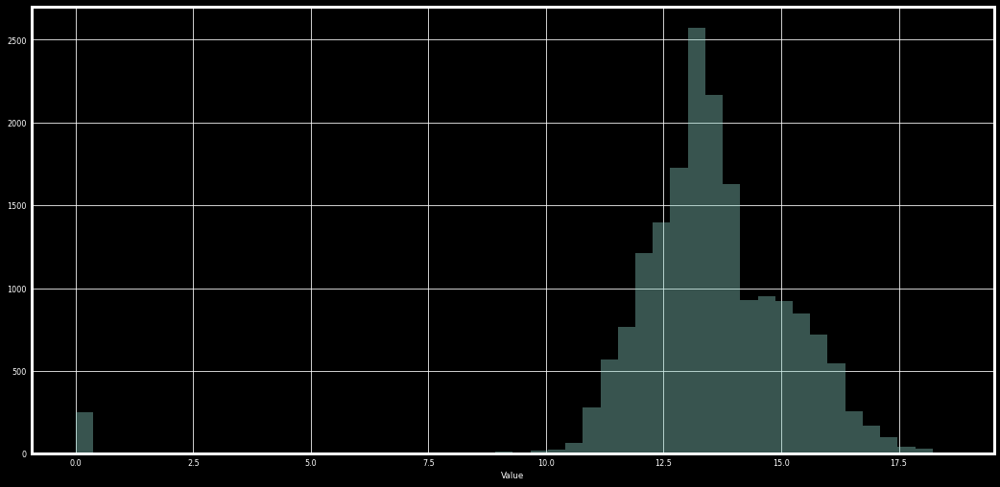

In [91]:
sns.distplot(y,kde=False)

In [92]:
y_index = y[y>7].index
X = X.loc[y_index]
y = y[y>7]
print(X.shape, y.shape)

(17955, 45) (17955,)


In [93]:
X.head()

,Age,Overall,Potential,Special,International Reputation,Weak Foot,Skill Moves,Height,Weight,Crossing,...,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Major_Nation,Right_Foot
0,31,94,94,2202,5.0,4.0,4.0,5'7,159.0,84.0,...,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0,1,0
1,33,94,94,2228,5.0,4.0,5.0,6'2,183.0,84.0,...,28.0,31.0,23.0,7.0,11.0,15.0,14.0,11.0,1,1
2,26,92,93,2143,5.0,5.0,5.0,5'9,150.0,79.0,...,27.0,24.0,33.0,9.0,9.0,15.0,15.0,11.0,1,1
3,27,91,93,1471,4.0,3.0,1.0,6'4,168.0,17.0,...,15.0,21.0,13.0,90.0,85.0,87.0,88.0,94.0,1,1
4,27,91,92,2281,4.0,5.0,4.0,5'11,154.0,93.0,...,68.0,58.0,51.0,15.0,13.0,5.0,10.0,13.0,1,1


In [95]:
X.shape

(17955, 45)

### World’s Best Playing XI 

In [40]:
df = pd.read_csv("FullData.csv")
df.head(7)

,Name,Nationality,National_Position,National_Kit,Club,Club_Position,Club_Kit,Club_Joining,Contract_Expiry,Rating,...,Long_Shots,Curve,Freekick_Accuracy,Penalties,Volleys,GK_Positioning,GK_Diving,GK_Kicking,GK_Handling,GK_Reflexes
0,Cristiano Ronaldo,Portugal,LS,7.0,Real Madrid,LW,7.0,07/01/2009,2021.0,94,...,90,81,76,85,88,14,7,15,11,11
1,Lionel Messi,Argentina,RW,10.0,FC Barcelona,RW,10.0,07/01/2004,2018.0,93,...,88,89,90,74,85,14,6,15,11,8
2,Neymar,Brazil,LW,10.0,FC Barcelona,LW,11.0,07/01/2013,2021.0,92,...,77,79,84,81,83,15,9,15,9,11
3,Luis Suárez,Uruguay,LS,9.0,FC Barcelona,ST,9.0,07/11/2014,2021.0,92,...,86,86,84,85,88,33,27,31,25,37
4,Manuel Neuer,Germany,GK,1.0,FC Bayern,GK,1.0,07/01/2011,2021.0,92,...,16,14,11,47,11,91,89,95,90,89
5,De Gea,Spain,GK,1.0,Manchester Utd,GK,1.0,07/01/2011,2019.0,90,...,12,21,19,40,13,86,88,87,85,90
6,Robert Lewandowski,Poland,LS,9.0,FC Bayern,ST,9.0,07/01/2014,2021.0,90,...,82,77,76,81,86,8,15,12,6,10


##### Finding The Best Goalkeeper

In [41]:
#weights
a = 0.5
b = 1
c= 2
d = 3
 
#GoalKeeping Characterstics
df['gk_Shot_Stopper'] = (b*df.Reactions + b*df.Composure + a*df.Speed + a*df.Strength + c*df.Jumping + b*df.GK_Positioning + c*df.GK_Diving + d*df.GK_Reflexes + b*df.GK_Handling)/(2*a + 4*b + 2*c + 1*d)
df['gk_Sweeper'] = (b*df.Reactions + b*df.Composure + b*df.Speed + a*df.Short_Pass + a*df.Long_Pass + b*df.Jumping + b*df.GK_Positioning + b*df.GK_Diving + d*df.GK_Reflexes + b*df.GK_Handling + d*df.GK_Kicking + c*df.Vision)/(2*a + 4*b + 3*c + 2*d)

Text(0, 0.5, 'Shot Stopping Score')

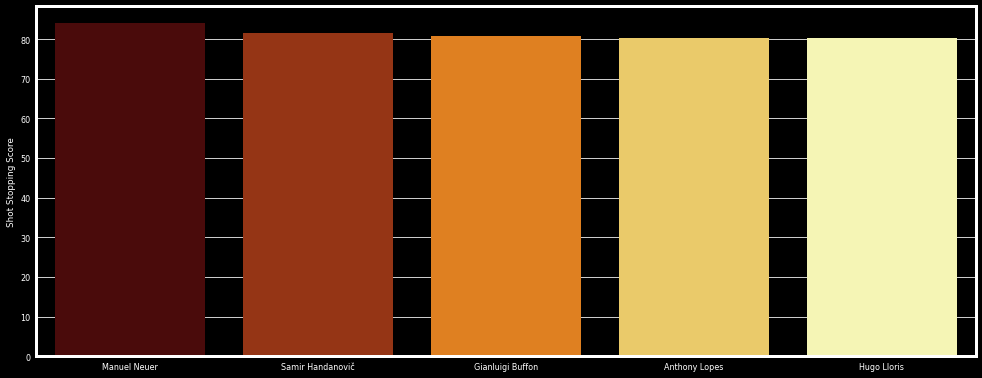

In [44]:
plt.figure(figsize=(15,6))
 
# Generate sequential data and plot
sd = df.sort_values('gk_Shot_Stopper', ascending=False)[:5]
x1 = np.array(list(sd['Name']))
y1 = np.array(list(sd['gk_Shot_Stopper']))
sns.barplot(x1, y1, palette= "afmhot")
ax.set(facecolor = "wheat")
plt.ylabel("Shot Stopping Score")

Text(0, 0.5, 'Sweeping Score')

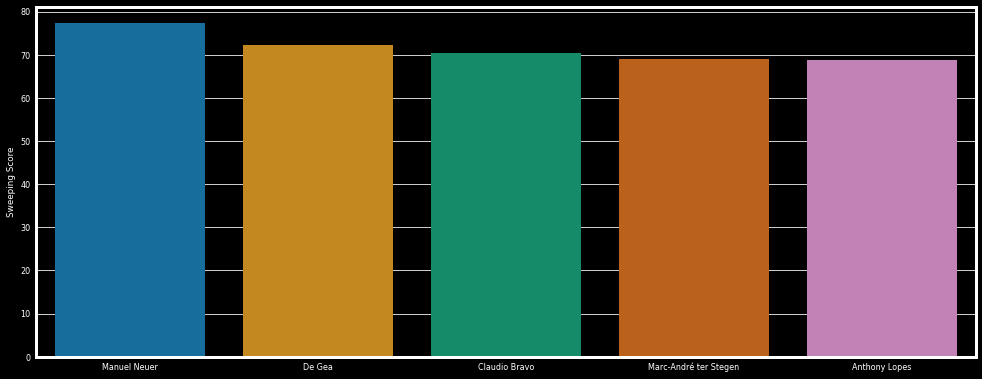

In [45]:
plt.figure(figsize=(15,6))
sd = df.sort_values('gk_Sweeper', ascending=False)[:5]
x2 = np.array(list(sd['Name']))
y2 = np.array(list(sd['gk_Sweeper']))
sns.barplot(x2, y2, palette= "colorblind")
plt.ylabel("Sweeping Score")

<img src = "GK.png"/>

##### Finding The Best Defenders

In [46]:
#Choosing Defenders
df['df_centre_backs'] = ( d*df.Reactions + c*df.Interceptions + d*df.Sliding_Tackle + d*df.Standing_Tackle + b*df.Vision+ b*df.Composure + b*df.Crossing +a*df.Short_Pass + b*df.Long_Pass+ c*df.Acceleration + b*df.Speed
+ d*df.Stamina + d*df.Jumping + d*df.Heading + b*df.Long_Shots + d*df.Marking + c*df.Aggression)/(6*b + 3*c + 7*d)
df['df_wb_Wing_Backs'] = (b*df.Ball_Control + a*df.Dribbling + a*df.Marking + d*df.Sliding_Tackle + d*df.Standing_Tackle + a*df.Attacking_Position + c*df.Vision + c*df.Crossing + b*df.Short_Pass + c*df.Long_Pass + d*df.Acceleration +d*df.Speed + c*df.Stamina + a*df.Finishing)/(4*a + 2*b + 4*c + 4*d)

Text(0, 0.5, 'LCB Score')

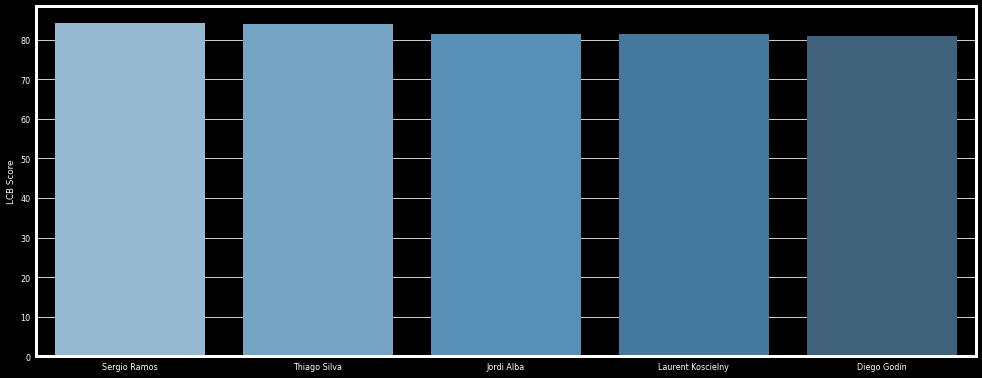

In [47]:
#LEFT CENTRAL DEFENDER:
plt.figure(figsize=(15,6))
sd = df[(df['Club_Position'] == 'LCB')].sort_values('df_centre_backs', ascending=False)[:5]
x2 = np.array(list(sd['Name']))
y2 = np.array(list(sd['df_centre_backs']))
sns.barplot(x2, y2, palette=sns.color_palette("Blues_d"))
plt.ylabel("LCB Score")

Text(0, 0.5, 'RCB Score')

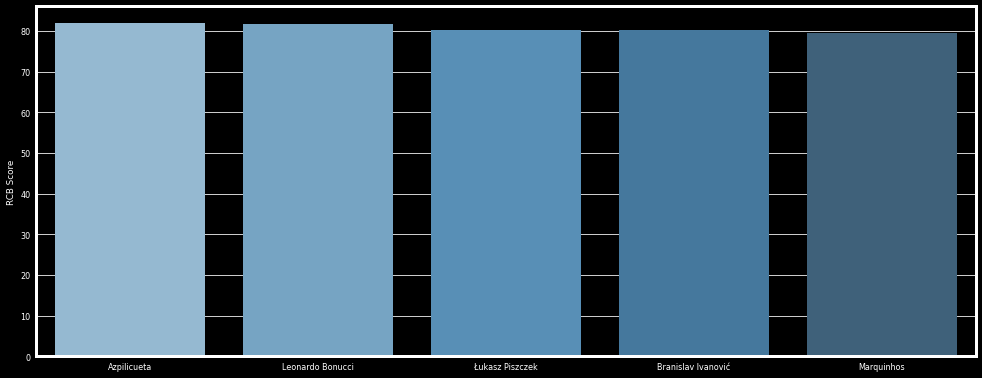

In [48]:
#RIGHT CENTRAL DEFENDER:
plt.figure(figsize=(15,6))
 
sd = df[(df['Club_Position'] == 'RCB')].sort_values('df_centre_backs', ascending=False)[:5]
x2 = np.array(list(sd['Name']))
y2 = np.array(list(sd['df_centre_backs']))
sns.barplot(x2, y2, palette=sns.color_palette("Blues_d"))
plt.ylabel("RCB Score")

Text(0, 0.5, 'Left Back Score')

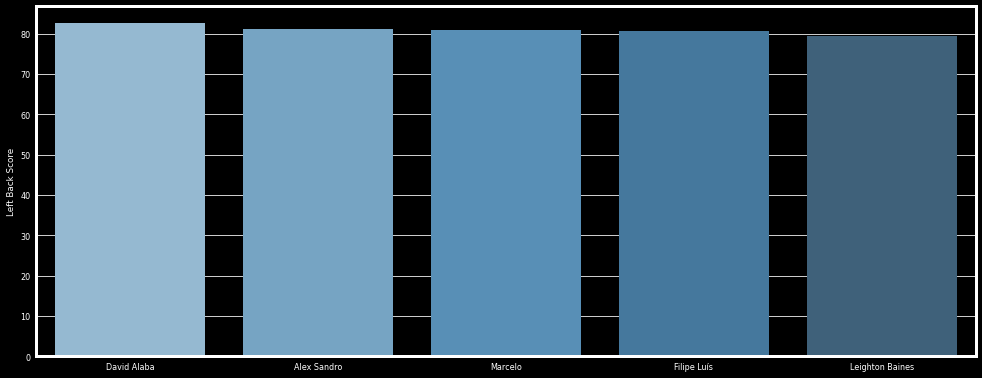

In [49]:
#LEFT WING BACK:
plt.figure(figsize=(15,6))
 
sd = df[(df['Club_Position'] == 'LWB') | (df['Club_Position'] == 'LB')].sort_values('df_wb_Wing_Backs', ascending=False)[:5]
x4 = np.array(list(sd['Name']))
y4 = np.array(list(sd['df_wb_Wing_Backs']))
sns.barplot(x4, y4, palette=sns.color_palette("Blues_d"))
plt.ylabel("Left Back Score")

Text(0, 0.5, 'Right Back Score')

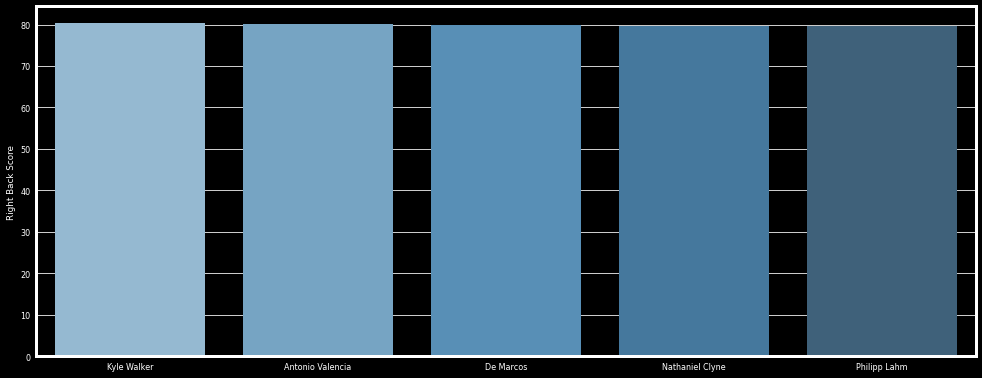

In [50]:
#RIGHT WING BACK:
plt.figure(figsize=(15,6))
sd = df[(df['Club_Position'] == 'RWB') | (df['Club_Position'] == 'RB')].sort_values('df_wb_Wing_Backs', ascending=False)[:5]
x5 = np.array(list(sd['Name']))
y5 = np.array(list(sd['df_wb_Wing_Backs']))
sns.barplot(x5, y5, palette=sns.color_palette("Blues_d"))
plt.ylabel("Right Back Score")

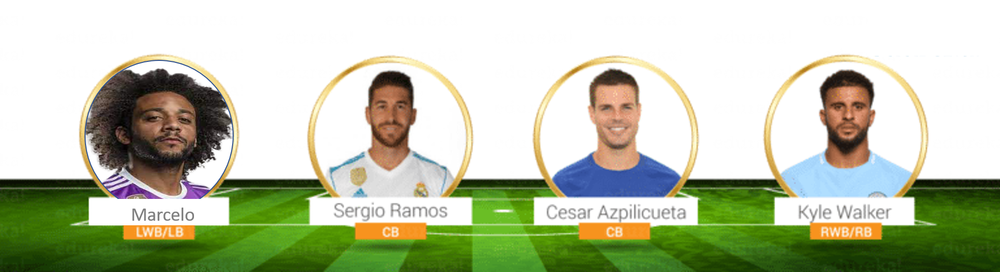

##### Finding The Best Mid-Fielders

In [58]:
#Midfielding Indices

df['mf_playmaker'] = (d*df.Ball_Control + d*df.Dribbling + a*df.Marking + d*df.Reactions + d*df.Vision + c*df.Attacking_Position + c*df.Crossing + d*df.Short_Pass + c*df.Long_Pass + c*df.Curve + b*df.Long_Shots + c*df.Freekick_Accuracy)/(1*a + 1*b + 4*c + 4*d)
df['mf_beast'] = (d*df.Agility + c*df.Balance + b*df.Jumping + c*df.Strength + d*df.Stamina + a*df.Speed + c*df.Acceleration + d*df.Short_Pass + c*df.Aggression + d*df.Reactions + b*df.Marking + b*df.Standing_Tackle + b*df.Sliding_Tackle + b*df.Interceptions)/(1*a + 5*b + 4*c + 4*d)
df['mf_controller'] = (b*df.Weak_foot + d*df.Ball_Control + a*df.Dribbling + a*df.Marking + a*df.Reactions + c*df.Vision + c*df.Composure + d*df.Short_Pass + d*df.Long_Pass)/(2*c + 3*d + 4*a)

Text(0, 0.5, 'PlayMaker Score')

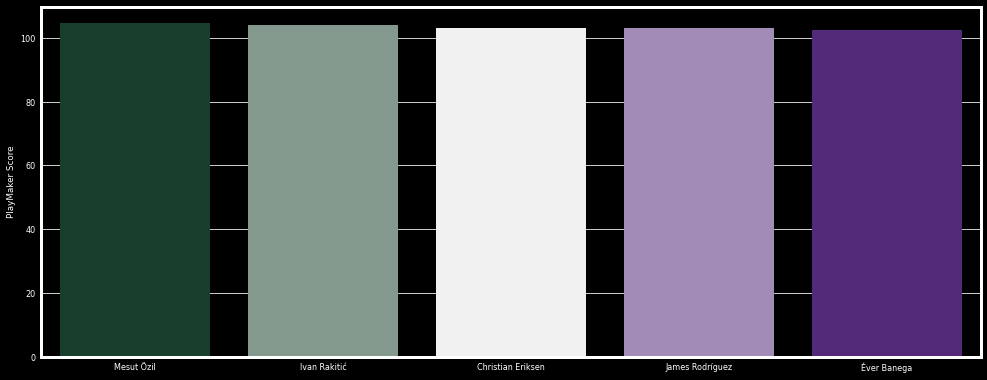

In [59]:
#PLAYMAKER:

plt.figure(figsize=(15,6))
 
ss = df[(df['Club_Position'] == 'CAM') | (df['Club_Position'] == 'LAM') | (df['Club_Position'] == 'RAM')].sort_values('mf_playmaker', ascending=False)[:5]
x3 = np.array(list(ss['Name']))
y3 = np.array(list(ss['mf_playmaker']))
sns.barplot(x3, y3, palette=sns.diverging_palette(145, 280, s=85, l=25, n=5))
plt.ylabel("PlayMaker Score")

Text(0, 0.5, 'Beast Score')

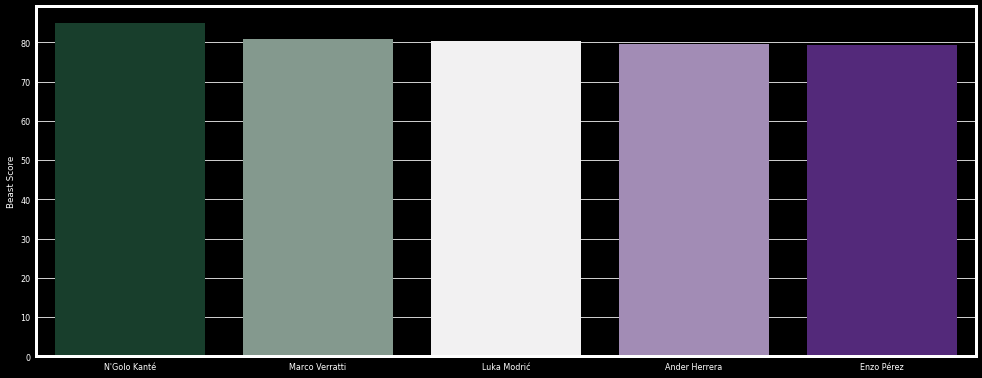

In [60]:
#BEAST:

plt.figure(figsize=(15,6))
 
ss = df[(df['Club_Position'] == 'RCM') | (df['Club_Position'] == 'RM')].sort_values('mf_beast', ascending=False)[:5]
x2 = np.array(list(ss['Name']))
y2 = np.array(list(ss['mf_beast']))
sns.barplot(x2, y2, palette=sns.diverging_palette(145, 280, s=85, l=25, n=5))
plt.ylabel("Beast Score")

Text(0, 0.5, 'Controller Score')

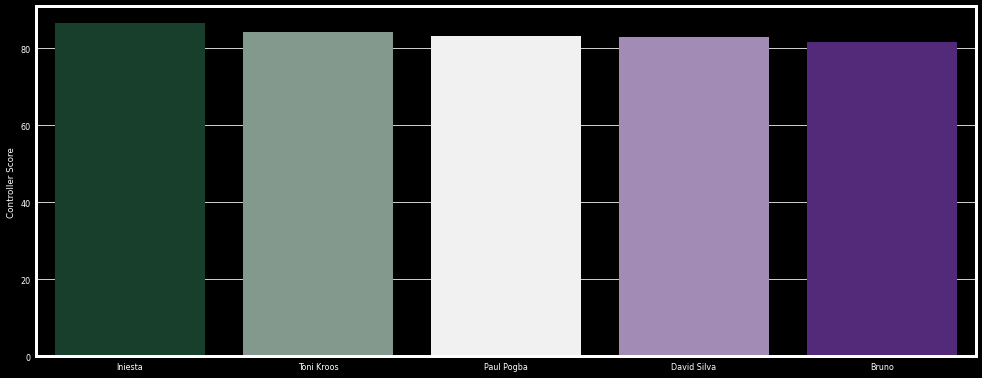

In [61]:
#CONTROLLER:

plt.figure(figsize=(15,6))
 
# Generate some sequential data
ss = df[(df['Club_Position'] == 'LCM') | (df['Club_Position'] == 'LM')].sort_values('mf_controller', ascending=False)[:5]
x1 = np.array(list(ss['Name']))
y1 = np.array(list(ss['mf_controller']))
sns.barplot(x1, y1, palette=sns.diverging_palette(145, 280, s=85, l=25, n=5))
plt.ylabel("Controller Score")

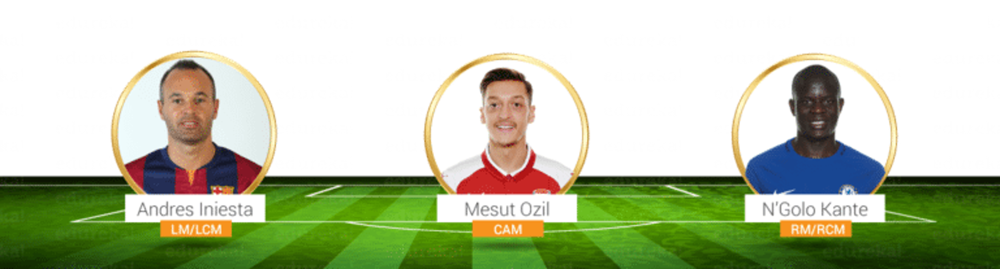

##### Finding The Best Attackers

In [62]:
#Attackers
df['att_left_wing'] = (c*df.Weak_foot + c*df.Ball_Control + c*df.Dribbling + c*df.Speed + d*df.Acceleration + b*df.Vision + c*df.Crossing + b*df.Short_Pass + b*df.Long_Pass + b*df.Aggression + b*df.Agility + a*df.Curve + c*df.Long_Shots + b*df.Freekick_Accuracy + d*df.Finishing)/(a + 6*b + 6*c + 2*d)
df['att_right_wing'] = (c*df.Weak_foot + c*df.Ball_Control + c*df.Dribbling + c*df.Speed + d*df.Acceleration + b*df.Vision + c*df.Crossing + b*df.Short_Pass + b*df.Long_Pass + b*df.Aggression + b*df.Agility + a*df.Curve + c*df.Long_Shots + b*df.Freekick_Accuracy + d*df.Finishing)/(a + 6*b + 6*c + 2*d)
df['att_striker'] = (b*df.Weak_foot + b*df.Ball_Control + a*df.Vision + b*df.Aggression + b*df.Agility + a*df.Curve + a*df.Long_Shots + d*df.Balance + d*df.Finishing + d*df.Heading + c*df.Jumping + c*df.Dribbling)/(3*a + 4*b + 2*c + 3*d)

Text(0, 0.5, 'Left Wing')

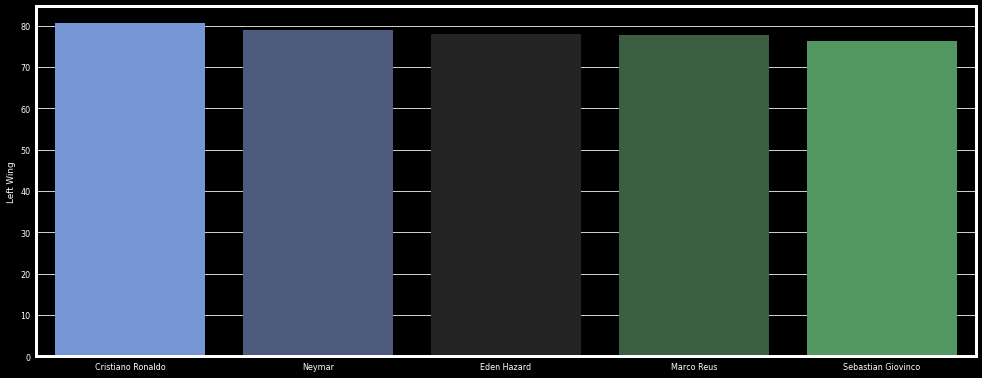

In [63]:
plt.figure(figsize=(15,6))
 
ss = df[(df['Club_Position'] == 'LW') | (df['Club_Position'] == 'LM') | (df['Club_Position'] == 'LS')].sort_values('att_left_wing', ascending=False)[:5]
x1 = np.array(list(ss['Name']))
y1 = np.array(list(ss['att_left_wing']))
sns.barplot(x1, y1, palette=sns.diverging_palette(255, 133, l=60, n=5, center="dark"))
plt.ylabel("Left Wing")

Text(0, 0.5, 'Right Wing')

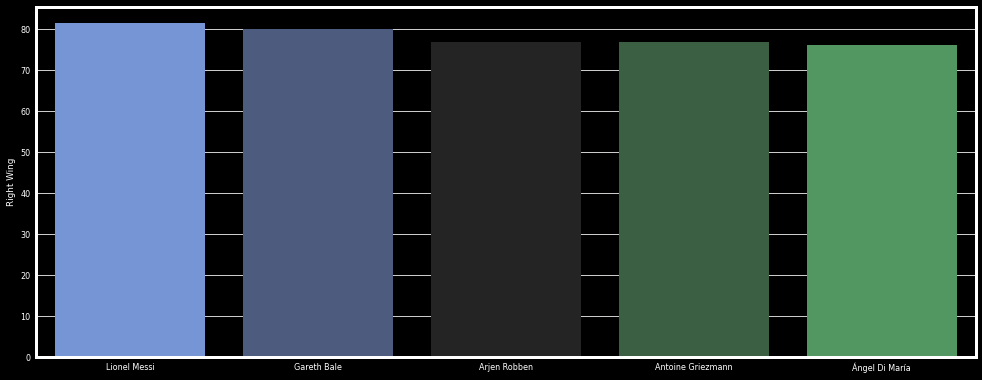

In [64]:
plt.figure(figsize=(15,6))
 
ss = df[(df['Club_Position'] == 'RW') | (df['Club_Position'] == 'RM') | (df['Club_Position'] == 'RS')].sort_values('att_right_wing', ascending=False)[:5]
x2 = np.array(list(ss['Name']))
y2 = np.array(list(ss['att_right_wing']))
sns.barplot(x2, y2, palette=sns.diverging_palette(255, 133, l=60, n=5, center="dark"))
plt.ylabel("Right Wing")

Text(0, 0.5, 'Striker')

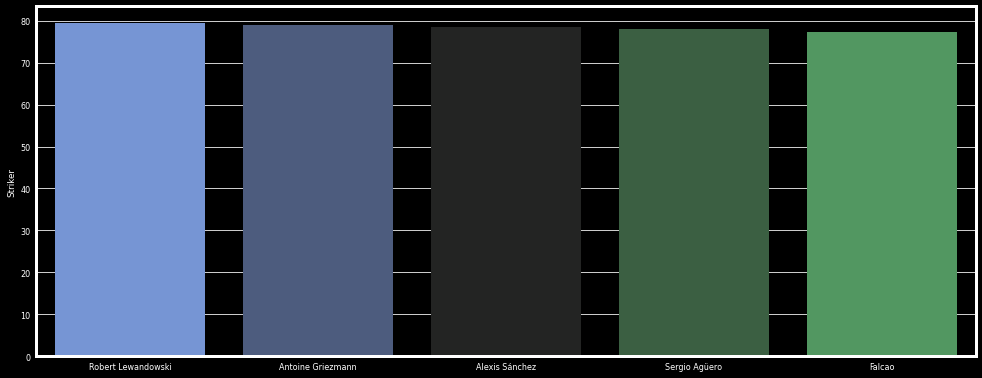

In [65]:
#STRIKER:

plt.figure(figsize=(15,6))
ss = df[(df['Club_Position'] == 'ST') | (df['Club_Position'] == 'LS') | (df['Club_Position'] == 'RS') | (df['Club_Position'] == 'CF')].sort_values('att_striker', ascending=False)[:5]
x3 = np.array(list(ss['Name']))
y3 = np.array(list(ss['att_striker']))
sns.barplot(x3, y3, palette=sns.diverging_palette(255, 133, l=60, n=5, center="dark"))
plt.ylabel("Striker")

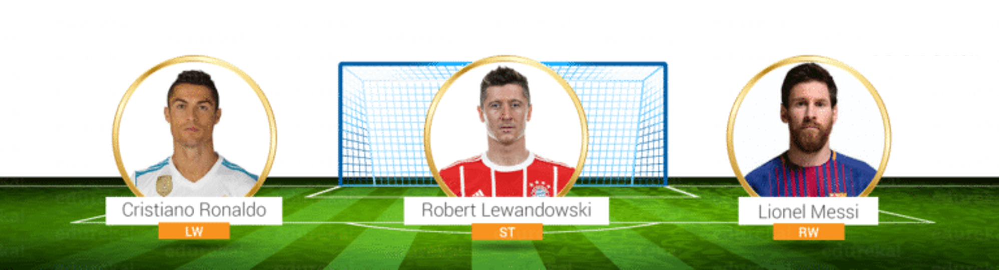

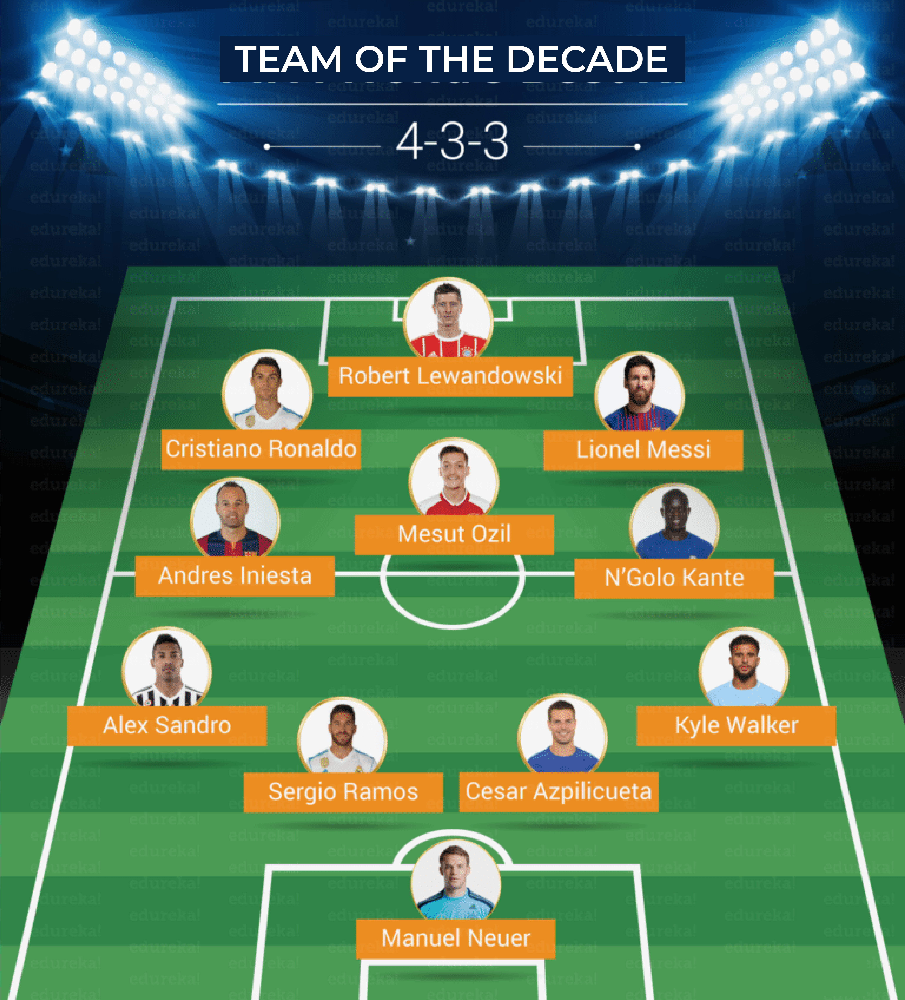

# THANK YOU!!!

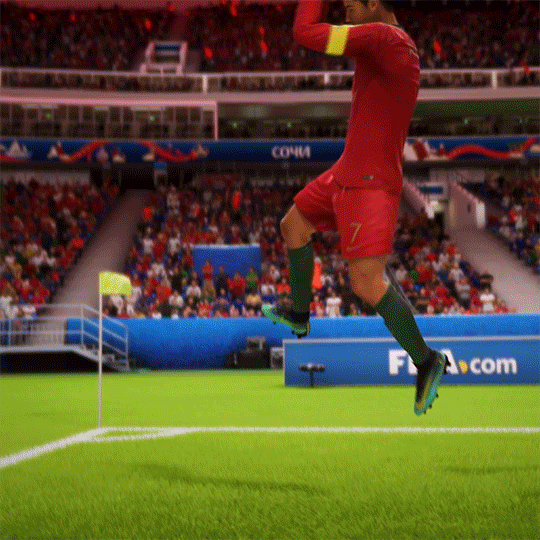